# All KPI 23/10/2024

## This project is taking data from salesforce and transferring the data in my SQL so that can be used for creating performance & Reward Dashboard

## Basic Setting

### Dafault Folders

In [40]:
import os

import pandas as pd

# Change the current working directory
os.chdir("C:/Users/srigd/Desktop/My Project/Dashboard/Calendar KPI")

# # Now, when you open a file without specifying a full path, Python looks in the current working directory
# with open('another_file.txt', 'w') as f:
#     f.write('This file is saved in the specified default directory.')

# Row and column setting
pd.set_option("display.max_rows", 100)  # Show all rows
pd.set_option("display.max_columns", None)  # Show all columns

## Function 

#### Show Dataframe

In [41]:
# import dtale
# import pandas as pd

# # Create a DataFrame


# # Function to display the DataFrame in a new tab using dtale
# def show(df):
#     d = dtale.show(df)
#     d.open_browser()

# # Call the function to display the DataFrame in a new tab

### Format Dataframe

In [42]:
import numpy as np
import pandas as pd
from IPython.display import display


def format_dataframe(
    df,
    precision=2,
    thousands_separator=True,
    date_format="%Y-%m-%d",
    max_rows=None,
    max_cols=None,
    column_width=None,
    style=True,
):
    """
    Format a pandas DataFrame with improved readability and styling.

    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame to format
    precision : int, default 2
        Number of decimal places for floating point numbers
    thousands_separator : bool, default True
        Whether to add thousand separators to numerical values
    date_format : str, default '%Y-%m-%d'
        Format for datetime columns
    max_rows : int, optional
        Maximum number of rows to display
    max_cols : int, optional
        Maximum number of columns to display
    column_width : int, optional
        Maximum width for columns
    style : bool, default True
        Whether to apply style formatting (background colors, etc.)

    Returns:
    --------
    pandas.DataFrame
        Formatted DataFrame
    """
    # Create a copy to avoid modifying the original
    formatted_df = df.copy()

    # Set display options
    pd.set_option("display.max_rows", max_rows if max_rows else 50)
    pd.set_option("display.max_columns", max_cols if max_cols else 20)
    pd.set_option("display.width", column_width if column_width else 1000)
    pd.set_option("display.precision", precision)

    # Format numeric columns
    numeric_columns = formatted_df.select_dtypes(include=[np.number]).columns
    for col in numeric_columns:
        if thousands_separator:
            formatted_df[col] = formatted_df[col].apply(
                lambda x: "{:,}".format(round(x, precision)) if pd.notnull(x) else x
            )

    # Format datetime columns
    date_columns = formatted_df.select_dtypes(include=["datetime64"]).columns
    for col in date_columns:
        formatted_df[col] = formatted_df[col].dt.strftime(date_format)

    if style:
        # Apply styling
        styled_df = (
            formatted_df.style.set_properties(
                **{
                    "background-color": "#f5f5f5",
                    "color": "black",
                    "border-color": "#888888",
                    "padding": "5px",
                }
            )
            .set_table_styles(
                [
                    {
                        "selector": "th",
                        "props": [
                            ("background-color", "#4CAF50"),
                            ("color", "white"),
                            ("font-weight", "bold"),
                            ("padding", "5px"),
                            ("border", "1px solid #888888"),
                        ],
                    },
                    {"selector": "td", "props": [("border", "1px solid #888888")]},
                    {
                        "selector": "",
                        "props": [
                            ("border-collapse", "collapse"),
                            ("border", "1px solid #888888"),
                        ],
                    },
                ]
            )
            .highlight_null(props={"background-color": "#ffcdd2"})
        )  # Updated syntax for highlighting null values

        return styled_df

    return formatted_df


# Example usage function
def display_formatted_df(df, **kwargs):
    """
    Wrapper function to quickly display a formatted DataFrame
    """
    formatted = format_dataframe(df, **kwargs)
    display(formatted)

### Sum of columns

In [43]:
import pandas as pd


# Define the function
def print_column_sums(df, *columns):
    for column in columns:
        if column in df.columns:
            column_sum = df[column].sum()
            print(f"Column '{column}' number = {column_sum}")
        else:
            print(f"Column '{column}' does not exist in the DataFrame")


# Example usage
# Assuming df is your DataFrame
# Call the function with the DataFrame and column names as arguments
# print_column_sums(df, 'column1', 'column2', 'column3')

### Object to date function

In [44]:
import numpy as np
import pandas as pd


def convert_to_datetime_or_date(df, columns, format_type="datetime"):
    """
    Convert specified columns in a DataFrame to datetime or date format.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the columns to be converted.
    columns (list): List of column names to be converted.
    format_type (str): The target format ('datetime' or 'date'). Default is 'datetime'.

    Returns:
    pd.DataFrame: The DataFrame with specified columns converted.
    """
    for column in columns:
        if column in df.columns:
            if format_type == "datetime":
                df[column] = pd.to_datetime(df[column])
                # Remove timezone if present to ensure consistency
                df[column] = df[column].dt.tz_localize(None)
            elif format_type == "date":
                df[column] = pd.to_datetime(df[column]).dt.normalize()
                # Remove timezone if present to ensure consistency
                df[column] = df[column].dt.tz_localize(None)
            else:
                raise ValueError("Invalid format_type. Use 'datetime' or 'date'.")
        else:
            print(f"Warning: '{column}' not found in DataFrame columns.")
    return df


# # example of calling the function
# df = convert_to_datetime_or_date(df, ['SalesforceDateTime', 'AnotherDateTime'], format_type='date')

### Access data from salesforce via SOQL

In [45]:
import keyring
import pandas as pd
import requests
from simple_salesforce import Salesforce


def export_salesforce_data(query, export_file=None):
    # Retrieve your credentials
    username = keyring.get_password("salesforce", "username")
    password = keyring.get_password("salesforce", "password")
    security_token = keyring.get_password("salesforce", "security_token")
    consumer_key = keyring.get_password("salesforce", "consumer_key")
    consumer_secret = keyring.get_password("salesforce", "consumer_secret")

    # Step 1: Obtain OAuth 2.0 token
    token_url = "https://login.salesforce.com/services/oauth2/token"
    payload = {
        "grant_type": "password",
        "client_id": consumer_key,
        "client_secret": consumer_secret,
        "username": username,
        "password": password + security_token,
    }
    response = requests.post(token_url, data=payload)
    response.raise_for_status()  # Check if the request was successful

    # Extract access token from the response
    access_token = response.json().get("access_token")
    instance_url = response.json().get("instance_url")

    # Step 2: Authenticate to Salesforce using the access token
    sf = Salesforce(instance_url=instance_url, session_id=access_token)

    # Step 3: Query data
    records = []
    query_result = sf.query_all(query)
    records.extend(query_result["records"])

    # Continue querying if there are more records
    while not query_result["done"]:
        query_result = sf.query_more(query_result["nextRecordsUrl"], True)
        records.extend(query_result["records"])

    # Function to flatten nested dictionaries
    def flatten_record(record, parent_key="", sep="."):
        items = []
        for k, v in record.items():
            new_key = f"{parent_key}{sep}{k}" if parent_key else k
            if isinstance(v, dict):
                items.extend(flatten_record(v, new_key, sep=sep).items())
            else:
                items.append((new_key, v))
        return dict(items)

    # Flatten all records
    flattened_records = [flatten_record(record) for record in records]

    # Convert the data to a pandas DataFrame
    df = pd.DataFrame(flattened_records)

    # Clean up the DataFrame (remove Salesforce metadata)
    if "attributes.type" in df.columns:
        df = df.drop(columns=["attributes.type", "attributes.url"])

    # Optionally, export the DataFrame to a CSV file if export_file is provided
    if export_file:
        df.to_csv(export_file, index=False)
        print(f"Data exported to {export_file}")

    # Return the DataFrame
    return df


# example of calling the function


# # Example usage
# query = """
# SELECT
#     id,
#     User__c,
#     Name,
#     Primary__r.Name,
#     Staff_Activated__c,
#     Primary__r.POD__r.Name,
#     Role_Title__r.Name
# FROM
#     Staff__c
# """
# export_file = 'test.csv'

# # Get the DataFrame
# df = export_salesforce_data(query)

# # Display the DataFrame
# df

### Duplicacy Check

In [46]:
import pandas as pd


def check_duplicates(df, columns):
    """
    This function checks for duplicate records based on one or more columns in a Pandas DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame to check for duplicates.
    columns (str or list): The column name (or a list of column names) to check for duplicates.

    Returns:
    bool: Returns True if duplicates are found, otherwise False.
    Displays the duplicated rows if any are found.
    """
    # Check if a single column or a list of columns is passed
    if isinstance(columns, str):
        columns = [columns]

    # Check for duplicates based on the specified column(s)
    duplicates = df[df.duplicated(subset=columns, keep=False)]

    if not duplicates.empty:
        print("Duplicates found:")
        print(duplicates)
        return True
    else:
        print("No duplicates found.")
        return False


# Example usage:
# Creating a sample DataFrame
data = {"A": [1, 2, 2, 4], "B": [5, 6, 6, 8], "C": ["X", "Y", "Y", "Z"]}

df = pd.DataFrame(data)

# Check for duplicates in a single column
check_duplicates(df, "A")

# Check for duplicates in multiple columns
check_duplicates(df, ["A", "B"])

Duplicates found:
   A  B  C
1  2  6  Y
2  2  6  Y
Duplicates found:
   A  B  C
1  2  6  Y
2  2  6  Y


True

### Exporting the data to MYSQL80

In [47]:
import urllib.parse

import pandas as pd
import win32cred
from sqlalchemy import create_engine
from sqlalchemy.orm import sessionmaker
from sqlalchemy.types import Date


def get_windows_credentials(target_name):
    """Retrieve credentials from Windows Credential Manager."""
    creds = win32cred.CredRead(target_name, win32cred.CRED_TYPE_GENERIC, 0)
    username = creds["UserName"]
    password = creds["CredentialBlob"].decode("utf-16")
    return username, password


def load_dataframe_to_mysql(df, table_name):
    """Load a DataFrame into a MySQL table with the same structure as the DataFrame."""
    # Retrieve credentials
    target_name = "SQLServerConnection"
    username, password = get_windows_credentials(target_name)

    # MySQL connection details
    host = "localhost"
    database = "edwardmellorsalesforce"

    # URL-encode the password
    encoded_password = urllib.parse.quote_plus(password)

    # Create a connection string
    connection_string = (
        f"mysql+mysqlconnector://{username}:{encoded_password}@{host}/{database}"
    )

    # Create SQLAlchemy engine with increased timeout and autocommit
    engine = create_engine(
        connection_string, connect_args={"connect_timeout": 600, "autocommit": True}
    )

    # Detect and convert date columns
    dtype = {}
    for column in df.columns:
        if pd.api.types.is_datetime64_any_dtype(df[column]):
            # Convert to DATE format in DataFrame
            df[column] = pd.to_datetime(df[column]).dt.date
            # Add to dtype dictionary as DATE type for MySQL
            dtype[column] = Date

    try:
        # Load DataFrame into MySQL with the specified dtypes
        df.to_sql(
            name=table_name.lower(),
            con=engine,
            if_exists="replace",
            index=False,
            dtype=dtype,
            chunksize=1000,
        )
        print(
            f"DataFrame successfully exported to MySQL database into table '{table_name}'"
        )

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Ensure the connection is properly closed
        engine.dispose()
        print("Database connection closed.")


# Example usage
# load_dataframe_to_mysql(df, 'your_table_name')

## Source File

### Staff

In [48]:
# Example usage
query = """
SELECT 
    id,
    User__c,
    Name,
    Primary__c,
    Primary__r.Name,
    Staff_Activated__c,
    Primary__r.POD__c,
    Primary__r.POD__r.Name,
    Role_Title__c,
    Role_Title__r.Name
FROM
    Staff__c
WHERE
    User__c != NULL
"""

# Get the DataFrame
df = export_salesforce_data(query)

# Display the DataFrame
df

,Id,User__c,Name,Primary__c,Primary__r.attributes.type,Primary__r.attributes.url,Primary__r.Name,Primary__r.POD__c,Primary__r.POD__r.attributes.type,Primary__r.POD__r.attributes.url,Primary__r.POD__r.Name,Staff_Activated__c,Role_Title__c,Role_Title__r.attributes.type,Role_Title__r.attributes.url,Role_Title__r.Name,Primary__r.POD__r,Role_Title__r
0,a3o8W000000jmbxQAA,0058W00000EKrpxQAD,Mehak Nazam,a123t0000094gVvAAI,pba__Office__c,/services/data/v59.0/sobjects/pba__Office__c/a...,Financial Services,a3n8W000001Bp9GQAS,POD_Grouping__c,/services/data/v59.0/sobjects/POD_Grouping__c/...,Financial Services,True,a4m8W000000BTMiQAO,Role__c,/services/data/v59.0/sobjects/Role__c/a4m8W000...,Relationship Manager,NaN,NaN
1,a3o8W000000jmc2QAA,0058W00000EKsUHQA1,Lindsay Heath,a123t0000094gVvAAI,pba__Office__c,/services/data/v59.0/sobjects/pba__Office__c/a...,Financial Services,a3n8W000001Bp9GQAS,POD_Grouping__c,/services/data/v59.0/sobjects/POD_Grouping__c/...,Financial Services,True,a4m8W000000BTN0QAO,Role__c,/services/data/v59.0/sobjects/Role__c/a4m8W000...,Mortgage & Protection Advisor,NaN,NaN
2,a3o8W000000jmc7QAA,0058W00000ELDWxQAP,Brooke Rushworth,a128W000009I3uYQAS,pba__Office__c,/services/data/v59.0/sobjects/pba__Office__c/a...,To Be Completed,None,NaN,NaN,NaN,False,None,NaN,NaN,NaN,NaN,NaN
3,a3o8W000000jmcRQAQ,0058W00000ELWtIQAX,Christian Vose,a123t0000094bJrAAI,pba__Office__c,/services/data/v59.0/sobjects/pba__Office__c/a...,Droylsden,a3n8W000000mHtAQAU,POD_Grouping__c,/services/data/v59.0/sobjects/POD_Grouping__c/...,Droylsden & Gorton,True,a4m8W000000BTN5QAO,Role__c,/services/data/v59.0/sobjects/Role__c/a4m8W000...,Sales Progressor,NaN,NaN
4,a3o8W000000jmcWQAQ,0058W00000ELYo4QAH,Issabella Chapman,a123t0000094cP9AAI,pba__Office__c,/services/data/v59.0/sobjects/pba__Office__c/a...,Auction,a3n8W000001Bp9QQAS,POD_Grouping__c,/services/data/v59.0/sobjects/POD_Grouping__c/...,Auction,False,a4m8W000000BTMqQAO,Role__c,/services/data/v59.0/sobjects/Role__c/a4m8W000...,Auction Consultant,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,a3oWS0000007nFJYAY,005WS000001VSx7YAG,Brett Punnett,a123t0000094bJrAAI,pba__Office__c,/services/data/v59.0/sobjects/pba__Office__c/a...,Droylsden,a3n8W000000mHtAQAU,POD_Grouping__c,/services/data/v59.0/sobjects/POD_Grouping__c/...,Droylsden & Gorton,True,a4mWS000007GczlYAC,Role__c,/services/data/v59.0/sobjects/Role__c/a4mWS000...,Trainee Valuer,NaN,NaN
171,a3oWS0000007qujYAA,0053t000008UbxuAAC,Salesforce System User,a128W000009I3uYQAS,pba__Office__c,/services/data/v59.0/sobjects/pba__Office__c/a...,To Be Completed,None,NaN,NaN,NaN,True,None,NaN,NaN,NaN,NaN,NaN
172,a3oWS0000007r4PYAQ,0053t000008tEsbAAE,Jane Chisnall,a128W000009I3uYQAS,pba__Office__c,/services/data/v59.0/sobjects/pba__Office__c/a...,To Be Completed,None,NaN,NaN,NaN,False,None,NaN,NaN,NaN,NaN,NaN
173,a3oWS0000007rvdYAA,0053t000008tEtoAAE,Sophie Ormsby,a12WS000000ftoYYAQ,pba__Office__c,/services/data/v59.0/sobjects/pba__Office__c/a...,Property Management Lettings and Landlords,a3nWS00000VebrpYAB,POD_Grouping__c,/services/data/v59.0/sobjects/POD_Grouping__c/...,Property Management & Lettings,False,a4mWS000005bw6zYAA,Role__c,/services/data/v59.0/sobjects/Role__c/a4mWS000...,Property Management,NaN,NaN


In [49]:
df.dtypes

Id                                    object
User__c                               object
Name                                  object
Primary__c                            object
Primary__r.attributes.type            object
Primary__r.attributes.url             object
Primary__r.Name                       object
Primary__r.POD__c                     object
Primary__r.POD__r.attributes.type     object
Primary__r.POD__r.attributes.url      object
Primary__r.POD__r.Name                object
Staff_Activated__c                      bool
Role_Title__c                         object
Role_Title__r.attributes.type         object
Role_Title__r.attributes.url          object
Role_Title__r.Name                    object
Primary__r.POD__r                    float64
Role_Title__r                        float64
dtype: object

In [50]:
Staff = df[
    [
        "Id",
        "User__c",
        "Name",
        "Primary__c",
        "Primary__r.Name",
        "Staff_Activated__c",
        "Primary__r.POD__c",
        "Primary__r.POD__r.Name",
        "Role_Title__c",
        "Role_Title__r.Name",
    ]
].copy()

# Rename the columns
Staff.rename(
    columns={
        "User__c": "Staff_UserId",
        "Id": "Staff_StaffId",
        "Name": "Staff_UserName",
        "Staff_Activated__c": "Staff_ActiveStatus",
        "Primary__c": "Staff_OfficeId",
        "Primary__r.Name": "Staff_Office",
        "Primary__r.POD__c": "PODId",
        "Primary__r.POD__r.Name": "Staff_PODName",
        "Role_Title__c": "Staff_RoleTitleId",
        "Role_Title__r.Name": "Staff_Title",
    },
    inplace=True,
)

# user[user['Staff_UserID']=='0058W00000EKrpxQAD']

Staff["Staff_Status"] = np.where(
    Staff["Staff_ActiveStatus"] == 1, "Active", "Not Active"
)
Staff

,Staff_StaffId,Staff_UserId,Staff_UserName,Staff_OfficeId,Staff_Office,Staff_ActiveStatus,PODId,Staff_PODName,Staff_RoleTitleId,Staff_Title,Staff_Status
0,a3o8W000000jmbxQAA,0058W00000EKrpxQAD,Mehak Nazam,a123t0000094gVvAAI,Financial Services,True,a3n8W000001Bp9GQAS,Financial Services,a4m8W000000BTMiQAO,Relationship Manager,Active
1,a3o8W000000jmc2QAA,0058W00000EKsUHQA1,Lindsay Heath,a123t0000094gVvAAI,Financial Services,True,a3n8W000001Bp9GQAS,Financial Services,a4m8W000000BTN0QAO,Mortgage & Protection Advisor,Active
2,a3o8W000000jmc7QAA,0058W00000ELDWxQAP,Brooke Rushworth,a128W000009I3uYQAS,To Be Completed,False,None,NaN,None,NaN,Not Active
3,a3o8W000000jmcRQAQ,0058W00000ELWtIQAX,Christian Vose,a123t0000094bJrAAI,Droylsden,True,a3n8W000000mHtAQAU,Droylsden & Gorton,a4m8W000000BTN5QAO,Sales Progressor,Active
4,a3o8W000000jmcWQAQ,0058W00000ELYo4QAH,Issabella Chapman,a123t0000094cP9AAI,Auction,False,a3n8W000001Bp9QQAS,Auction,a4m8W000000BTMqQAO,Auction Consultant,Not Active
...,...,...,...,...,...,...,...,...,...,...,...
170,a3oWS0000007nFJYAY,005WS000001VSx7YAG,Brett Punnett,a123t0000094bJrAAI,Droylsden,True,a3n8W000000mHtAQAU,Droylsden & Gorton,a4mWS000007GczlYAC,Trainee Valuer,Active
171,a3oWS0000007qujYAA,0053t000008UbxuAAC,Salesforce System User,a128W000009I3uYQAS,To Be Completed,True,None,NaN,None,NaN,Active
172,a3oWS0000007r4PYAQ,0053t000008tEsbAAE,Jane Chisnall,a128W000009I3uYQAS,To Be Completed,False,None,NaN,None,NaN,Not Active
173,a3oWS0000007rvdYAA,0053t000008tEtoAAE,Sophie Ormsby,a12WS000000ftoYYAQ,Property Management Lettings and Landlords,False,a3nWS00000VebrpYAB,Property Management & Lettings,a4mWS000005bw6zYAA,Property Management,Not Active


In [51]:
Staff_Limited = Staff[["Staff_UserId", "Staff_UserName", "Staff_Title"]]
Staff_Limited

,Staff_UserId,Staff_UserName,Staff_Title
0,0058W00000EKrpxQAD,Mehak Nazam,Relationship Manager
1,0058W00000EKsUHQA1,Lindsay Heath,Mortgage & Protection Advisor
2,0058W00000ELDWxQAP,Brooke Rushworth,NaN
3,0058W00000ELWtIQAX,Christian Vose,Sales Progressor
4,0058W00000ELYo4QAH,Issabella Chapman,Auction Consultant
...,...,...,...
170,005WS000001VSx7YAG,Brett Punnett,Trainee Valuer
171,0053t000008UbxuAAC,Salesforce System User,NaN
172,0053t000008tEsbAAE,Jane Chisnall,NaN
173,0053t000008tEtoAAE,Sophie Ormsby,Property Management


In [52]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(Staff, "Staff")

DataFrame successfully exported to MySQL database into table 'Staff'
Database connection closed.


### Calendar

In [53]:
import re

query = """
SELECT
        Name,
        Date__c              ,
        Fiscal_Week__c       ,
        Days_of_Week__c      ,
        Fiscal_Period__c     ,
        Week_in_Period__c    ,
        Fiscal_Quarter__c    ,
        Fiscal_Reward_Week__c,
        Fiscal_Year__c,
         Period_Week_Token__c,
        Month__c,
        Month_Text__c    
        
FROM
        Edward_Mellor_Calendar__c
"""
# export_file = 'test.csv'

# Get the DataFrame
df = export_salesforce_data(query)
df["Year-Q-P-W"] = df["Name"].apply(
    lambda x: re.search(r"\[.*?\]", x).group(0) if re.search(r"\[.*?\]", x) else None
)
# df
Calendar = df[
    [
        "Year-Q-P-W",
        "Date__c",
        "Fiscal_Week__c",
        "Days_of_Week__c",
        "Fiscal_Period__c",
        "Week_in_Period__c",
        "Fiscal_Quarter__c",
        "Fiscal_Reward_Week__c",
        "Fiscal_Year__c",
        "Period_Week_Token__c",
        "Month__c",
        "Month_Text__c",
    ]
]
Calendar["Year-Q-P"] = (
    Calendar["Fiscal_Year__c"]
    + "-"
    + Calendar["Fiscal_Quarter__c"]
    + "-"
    + Calendar["Fiscal_Period__c"]
)
# Rename the columns
Calendar.rename(
    columns={
        "Date__c": "Calendar_Date",
        "Fiscal_Week__c": "Calendar_FiscalWeek",
        "Days_of_Week__c": "Calendar_DaysOfWeek",
        "Fiscal_Period__c": "Calendar_FiscalPeriod",
        "Week_in_Period__c": "Calendar_WeekInPeriod",
        "Fiscal_Quarter__c": "Calendar_FiscalQuarter",
        "Fiscal_Reward_Week__c": "Calendar_FiscalRewardWeek",
        "Fiscal_Year__c": "Calendar_FiscalYear",
        "Period_Week_Token__c": "Week_NumberInPeriod",
        "Month__c": "Calendar_Month",
        "Month_Text__c": "Calendar_Month_txt",
    },
    inplace=True,
)


# Calendar = convert_to_datetime_or_date(Calendar, ['Calendar_Date'], format_type='date')

Calendar = convert_to_datetime_or_date(
    Calendar, ["Calendar_Date"], format_type="datetime"
).copy()
Calendar

,Year-Q-P-W,Calendar_Date,Calendar_FiscalWeek,Calendar_DaysOfWeek,Calendar_FiscalPeriod,Calendar_WeekInPeriod,Calendar_FiscalQuarter,Calendar_FiscalRewardWeek,Calendar_FiscalYear,Week_NumberInPeriod,Calendar_Month,Calendar_Month_txt,Year-Q-P
0,[2023/24-Q1-P1-W1],2023-06-30,1.0,Friday,P1,4.0,Q1,4.0,2023/24,W1,6.0,June,2023/24-Q1-P1
1,[2023/24-Q1-P1-W1],2023-07-01,1.0,Saturday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
2,[2023/24-Q1-P1-W1],2023-07-02,1.0,Sunday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
3,[2023/24-Q1-P1-W1],2023-07-03,1.0,Monday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
4,[2023/24-Q1-P1-W1],2023-07-04,1.0,Tuesday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,[2024/25-Q4-P12-W5],2025-06-29,53.0,Sunday,P12,5.0,Q4,5.0,2024/25,W5,6.0,June,2024/25-Q4-P12
731,[2024/25-Q4-P12-W5],2025-06-30,53.0,Monday,P12,5.0,Q4,5.0,2024/25,W5,6.0,June,2024/25-Q4-P12
732,[2024/25-Q4-P12-W5],2025-07-01,53.0,Tuesday,P12,5.0,Q4,5.0,2024/25,W5,7.0,July,2024/25-Q4-P12
733,[2024/25-Q4-P12-W5],2025-07-02,53.0,Wednesday,P12,5.0,Q4,5.0,2024/25,W5,7.0,July,2024/25-Q4-P12


In [54]:
Calendar.dtypes

Year-Q-P-W                           object
Calendar_Date                datetime64[ns]
Calendar_FiscalWeek                 float64
Calendar_DaysOfWeek                  object
Calendar_FiscalPeriod                object
Calendar_WeekInPeriod               float64
Calendar_FiscalQuarter               object
Calendar_FiscalRewardWeek           float64
Calendar_FiscalYear                  object
Week_NumberInPeriod                  object
Calendar_Month                      float64
Calendar_Month_txt                   object
Year-Q-P                             object
dtype: object

In [55]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(Calendar, "Calendar")

DataFrame successfully exported to MySQL database into table 'Calendar'
Database connection closed.


### Office

In [56]:
# import re
query = """
select POD__c,POD__r.Name,id,Name from pba__Office__c 
"""
# export_file = 'test.csv'
# df
# Get the DataFrame
df = export_salesforce_data(query)
# df
# Rename the columns
df.rename(
    columns={
        "POD__c": "Office_POD",
        "POD__r.Name": "Office_PODName",
        "Id": "Office_OfficeId",
        "Name": "Office_OfficeName",
    },
    inplace=True,
)

Office = df[
    ["Office_POD", "Office_PODName", "Office_OfficeId", "Office_OfficeName"]
].copy()
Office

,Office_POD,Office_PODName,Office_OfficeId,Office_OfficeName
0,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",a123t0000094SQeAAM,Denton
1,a3n8W000000mHtAQAU,Droylsden & Gorton,a123t0000094bJrAAI,Droylsden
2,a3n8W000000mHtYQAU,Hazel Grove & Edgeley,a123t0000094bJwAAI,Edgeley
3,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",a123t0000094bK1AAI,Glossop
4,a3n8W000000mHtAQAU,Droylsden & Gorton,a123t0000094bK6AAI,Gorton
5,a3n8W000000mHtYQAU,Hazel Grove & Edgeley,a123t0000094bKBAAY,Hazel Grove
6,a3n8W000000mHtOQAU,Levenshulme & Reddish,a123t0000094bKCAAY,Levenshulme
7,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",a123t0000094bKGAAY,Hyde
8,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",a123t0000094bKHAAY,Stalybridge
9,a3n8W000000mHtTQAU,Cheshire (Stockton Heath & Northwich),a123t0000094bKIAAY,Stockton Heath


In [57]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(Office, "Office")

DataFrame successfully exported to MySQL database into table 'Office'
Database connection closed.


## Manipulated File

### Office_Calendar

In [58]:
# This will be useful while caculating Office Performance

In [59]:
Office["key"] = 1
Calendar["key"] = 1
Office_Calendar = pd.merge(Office, Calendar, on="key").drop("key", axis=1)
Office_Calendar

,Office_POD,Office_PODName,Office_OfficeId,Office_OfficeName,Year-Q-P-W,Calendar_Date,Calendar_FiscalWeek,Calendar_DaysOfWeek,Calendar_FiscalPeriod,Calendar_WeekInPeriod,Calendar_FiscalQuarter,Calendar_FiscalRewardWeek,Calendar_FiscalYear,Week_NumberInPeriod,Calendar_Month,Calendar_Month_txt,Year-Q-P
0,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",a123t0000094SQeAAM,Denton,[2023/24-Q1-P1-W1],2023-06-30,1.0,Friday,P1,4.0,Q1,4.0,2023/24,W1,6.0,June,2023/24-Q1-P1
1,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",a123t0000094SQeAAM,Denton,[2023/24-Q1-P1-W1],2023-07-01,1.0,Saturday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
2,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",a123t0000094SQeAAM,Denton,[2023/24-Q1-P1-W1],2023-07-02,1.0,Sunday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
3,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",a123t0000094SQeAAM,Denton,[2023/24-Q1-P1-W1],2023-07-03,1.0,Monday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
4,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",a123t0000094SQeAAM,Denton,[2023/24-Q1-P1-W1],2023-07-04,1.0,Tuesday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23515,a3nWS00000VebrpYAB,Property Management & Lettings,a12WS000000ftoYYAQ,Property Management Lettings and Landlords,[2024/25-Q4-P12-W5],2025-06-29,53.0,Sunday,P12,5.0,Q4,5.0,2024/25,W5,6.0,June,2024/25-Q4-P12
23516,a3nWS00000VebrpYAB,Property Management & Lettings,a12WS000000ftoYYAQ,Property Management Lettings and Landlords,[2024/25-Q4-P12-W5],2025-06-30,53.0,Monday,P12,5.0,Q4,5.0,2024/25,W5,6.0,June,2024/25-Q4-P12
23517,a3nWS00000VebrpYAB,Property Management & Lettings,a12WS000000ftoYYAQ,Property Management Lettings and Landlords,[2024/25-Q4-P12-W5],2025-07-01,53.0,Tuesday,P12,5.0,Q4,5.0,2024/25,W5,7.0,July,2024/25-Q4-P12
23518,a3nWS00000VebrpYAB,Property Management & Lettings,a12WS000000ftoYYAQ,Property Management Lettings and Landlords,[2024/25-Q4-P12-W5],2025-07-02,53.0,Wednesday,P12,5.0,Q4,5.0,2024/25,W5,7.0,July,2024/25-Q4-P12


### Staff_Calendar

In [60]:
# This will be useful to calculate employee performance

In [61]:
Staff["key"] = 1
Calendar["key"] = 1
Staff_Calendar = pd.merge(Staff, Calendar, on="key").drop("key", axis=1)
Staff_Calendar

,Staff_StaffId,Staff_UserId,Staff_UserName,Staff_OfficeId,Staff_Office,Staff_ActiveStatus,PODId,Staff_PODName,Staff_RoleTitleId,Staff_Title,Staff_Status,Year-Q-P-W,Calendar_Date,Calendar_FiscalWeek,Calendar_DaysOfWeek,Calendar_FiscalPeriod,Calendar_WeekInPeriod,Calendar_FiscalQuarter,Calendar_FiscalRewardWeek,Calendar_FiscalYear,Week_NumberInPeriod,Calendar_Month,Calendar_Month_txt,Year-Q-P
0,a3o8W000000jmbxQAA,0058W00000EKrpxQAD,Mehak Nazam,a123t0000094gVvAAI,Financial Services,True,a3n8W000001Bp9GQAS,Financial Services,a4m8W000000BTMiQAO,Relationship Manager,Active,[2023/24-Q1-P1-W1],2023-06-30,1.0,Friday,P1,4.0,Q1,4.0,2023/24,W1,6.0,June,2023/24-Q1-P1
1,a3o8W000000jmbxQAA,0058W00000EKrpxQAD,Mehak Nazam,a123t0000094gVvAAI,Financial Services,True,a3n8W000001Bp9GQAS,Financial Services,a4m8W000000BTMiQAO,Relationship Manager,Active,[2023/24-Q1-P1-W1],2023-07-01,1.0,Saturday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
2,a3o8W000000jmbxQAA,0058W00000EKrpxQAD,Mehak Nazam,a123t0000094gVvAAI,Financial Services,True,a3n8W000001Bp9GQAS,Financial Services,a4m8W000000BTMiQAO,Relationship Manager,Active,[2023/24-Q1-P1-W1],2023-07-02,1.0,Sunday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
3,a3o8W000000jmbxQAA,0058W00000EKrpxQAD,Mehak Nazam,a123t0000094gVvAAI,Financial Services,True,a3n8W000001Bp9GQAS,Financial Services,a4m8W000000BTMiQAO,Relationship Manager,Active,[2023/24-Q1-P1-W1],2023-07-03,1.0,Monday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
4,a3o8W000000jmbxQAA,0058W00000EKrpxQAD,Mehak Nazam,a123t0000094gVvAAI,Financial Services,True,a3n8W000001Bp9GQAS,Financial Services,a4m8W000000BTMiQAO,Relationship Manager,Active,[2023/24-Q1-P1-W1],2023-07-04,1.0,Tuesday,P1,4.0,Q1,4.0,2023/24,W1,7.0,July,2023/24-Q1-P1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128620,a3oWS0000007sDNYAY,005WS000001d0R0YAI,Julie Summers,a123t0000094SQeAAM,Denton,True,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",None,NaN,Active,[2024/25-Q4-P12-W5],2025-06-29,53.0,Sunday,P12,5.0,Q4,5.0,2024/25,W5,6.0,June,2024/25-Q4-P12
128621,a3oWS0000007sDNYAY,005WS000001d0R0YAI,Julie Summers,a123t0000094SQeAAM,Denton,True,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",None,NaN,Active,[2024/25-Q4-P12-W5],2025-06-30,53.0,Monday,P12,5.0,Q4,5.0,2024/25,W5,6.0,June,2024/25-Q4-P12
128622,a3oWS0000007sDNYAY,005WS000001d0R0YAI,Julie Summers,a123t0000094SQeAAM,Denton,True,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",None,NaN,Active,[2024/25-Q4-P12-W5],2025-07-01,53.0,Tuesday,P12,5.0,Q4,5.0,2024/25,W5,7.0,July,2024/25-Q4-P12
128623,a3oWS0000007sDNYAY,005WS000001d0R0YAI,Julie Summers,a123t0000094SQeAAM,Denton,True,a3n8W000000mHtEQAU,"Denton, Hyde & Stalybridge",None,NaN,Active,[2024/25-Q4-P12-W5],2025-07-02,53.0,Wednesday,P12,5.0,Q4,5.0,2024/25,W5,7.0,July,2024/25-Q4-P12


In [62]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(Staff_Calendar, "Staff_Calendar")

DataFrame successfully exported to MySQL database into table 'Staff_Calendar'
Database connection closed.


### VPM by Office

In [63]:
# Example usage
query = """
SELECT 
    User__c,
    Name,
    Primary_Office_ID__c,
    Primary__c ,
    Office_Name__c,
    Job_Title_Name__c,
    Role_Title__c,
    Staff_Activated__c
FROM
    Staff__c
WHERE
    Job_Title_Name__c IN ('Vendor Performance Manager' , 'Assistant Vendor Performance Manager')
ORDER BY Office_Name__c

"""

df = export_salesforce_data(query)

# Display the DataFrame
df

,User__c,Name,Primary_Office_ID__c,Primary__c,Office_Name__c,Job_Title_Name__c,Role_Title__c,Staff_Activated__c
0,0053t000008UnRfAAK,Claire Daly,a123t0000094SQe,a123t0000094SQeAAM,Denton,Vendor Performance Manager,a4m8W000000BTMgQAO,True
1,0053t000008UnQvAAK,Natalie Soutter,a123t0000094bJr,a123t0000094bJrAAI,Droylsden,Vendor Performance Manager,a4m8W000000BTMgQAO,True
2,0058W000009YBLkQAO,Andrea O'Brien,a123t0000094bJw,a123t0000094bJwAAI,Edgeley,Vendor Performance Manager,a4m8W000000BTMgQAO,True
3,0053t000008t2DCAAY,Emma Booth,a123t0000094bKB,a123t0000094bKBAAY,Hazel Grove,Vendor Performance Manager,a4m8W000000BTMgQAO,True
4,0053t0000093lWkAAI,Leah Graham,a123t0000094bKG,a123t0000094bKGAAY,Hyde,Assistant Vendor Performance Manager,a4m8W000000BTMlQAO,True
5,0053t000008UnQsAAK,Joann Bull,a123t0000094bKC,a123t0000094bKCAAY,Levenshulme,Vendor Performance Manager,a4m8W000000BTMgQAO,True
6,0058W00000DVhQ9QAL,Nicola Mather,a123t0000094bKM,a123t0000094bKMAAY,Marple,Vendor Performance Manager,a4m8W000000BTMgQAO,True
7,0058W00000E4zGyQAJ,Daisy-May Tait-Davies,a123t0000094bKQ,a123t0000094bKQAAY,Northwich,Assistant Vendor Performance Manager,a4m8W000000BTMlQAO,True
8,0053t000008tDw3AAE,Stacey Moreland,a123t0000094bKV,a123t0000094bKVAAY,Reddish,Assistant Vendor Performance Manager,a4m8W000000BTMlQAO,True
9,0058W00000DVpX8QAL,Mark Richards,a123t00000BJNsm,a123t00000BJNsmAAH,Stockport,Vendor Performance Manager,a4m8W000000BTMgQAO,False


In [64]:
vpm = df[["Primary__c", "Office_Name__c", "User__c", "Name"]].copy()
vpm.rename(
    columns={
        "Primary__c": "VPM_OfficeId",
        "Office_Name__c": "VPM_Office",
        "User__c": "VPM_UserId",
        "Name": "VPM_Name",
    },
    inplace=True,
)
vpm

,VPM_OfficeId,VPM_Office,VPM_UserId,VPM_Name
0,a123t0000094SQeAAM,Denton,0053t000008UnRfAAK,Claire Daly
1,a123t0000094bJrAAI,Droylsden,0053t000008UnQvAAK,Natalie Soutter
2,a123t0000094bJwAAI,Edgeley,0058W000009YBLkQAO,Andrea O'Brien
3,a123t0000094bKBAAY,Hazel Grove,0053t000008t2DCAAY,Emma Booth
4,a123t0000094bKGAAY,Hyde,0053t0000093lWkAAI,Leah Graham
5,a123t0000094bKCAAY,Levenshulme,0053t000008UnQsAAK,Joann Bull
6,a123t0000094bKMAAY,Marple,0058W00000DVhQ9QAL,Nicola Mather
7,a123t0000094bKQAAY,Northwich,0058W00000E4zGyQAJ,Daisy-May Tait-Davies
8,a123t0000094bKVAAY,Reddish,0053t000008tDw3AAE,Stacey Moreland
9,a123t00000BJNsmAAH,Stockport,0058W00000DVpX8QAL,Mark Richards


In [65]:
vpm.to_excel("vpm.xlsx")

In [66]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(vpm, "vpm")

DataFrame successfully exported to MySQL database into table 'vpm'
Database connection closed.


## KPI Calculation

### Viewing & Mortgage Appointment

#### Raw Event Table

In [67]:
# Example usage
query = """
SELECT ID
	,RecordTypeId
	,RecordType.Name
	,Subject
	,CreatedById
	,CreatedBy.Name
	,Created_By_Staff__c
	,CreatedDate
	,StartDateTime
	,EndDateTime
	,Type
	,Created_By_Staff__r.Name
	,Listing__c
	,Listing__r.Name
	,Listing__r.Postcode__c
	,Listing__r.Lister__c
	,DurationInMinutes
    ,Office__c
    ,CALC_Office_ID__c
    ,Contact_Name_Text__c
FROM Event
 where CreatedDate > 2024-06-27T00:00:00Z 
"""

# Get the DataFrame
df = export_salesforce_data(query)

# Display the DataFrame
df

,Id,RecordTypeId,RecordType.attributes.type,RecordType.attributes.url,RecordType.Name,Subject,CreatedById,CreatedBy.attributes.type,CreatedBy.attributes.url,CreatedBy.Name,Created_By_Staff__c,CreatedDate,StartDateTime,EndDateTime,Type,Created_By_Staff__r,Listing__c,Listing__r,DurationInMinutes,Office__c,CALC_Office_ID__c,Contact_Name_Text__c,Listing__r.attributes.type,Listing__r.attributes.url,Listing__r.Name,Listing__r.Postcode__c,Listing__r.Lister__c,Created_By_Staff__r.attributes.type,Created_By_Staff__r.attributes.url,Created_By_Staff__r.Name
0,00U8W00000YdbnuUAB,0123t000000AkRIAA0,RecordType,/services/data/v59.0/sobjects/RecordType/0123t...,Admin,Print off Jaspinder ID from Wed email,0053t000008UnQVAA0,User,/services/data/v59.0/sobjects/User/0053t000008...,Calum Begg,None,2024-06-27T07:56:05.000+0000,2024-07-01T05:30:00.000+0000,2024-07-01T06:30:00.000+0000,None,NaN,None,NaN,60,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00U8W00000Ydbo9UAB,0123t000000NWciAAG,RecordType,/services/data/v59.0/sobjects/RecordType/0123t...,Event,Aisha Mushtaq figs,0053t0000093zxhAAA,User,/services/data/v59.0/sobjects/User/0053t000009...,William Whalley,None,2024-06-27T08:05:29.000+0000,2024-06-27T14:00:00.000+0000,2024-06-27T15:00:00.000+0000,None,NaN,None,NaN,60,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,00U8W00000YdboaUAB,0123t000000AkRIAA0,RecordType,/services/data/v59.0/sobjects/RecordType/0123t...,Admin,Chase Simpkin for VM docs,0053t000008UnQVAA0,User,/services/data/v59.0/sobjects/User/0053t000008...,Calum Begg,None,2024-06-27T08:11:44.000+0000,2024-07-02T14:00:00.000+0000,2024-07-02T15:00:00.000+0000,None,NaN,None,NaN,60,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,00U8W00000YdbokUAB,0123t000000AkRIAA0,RecordType,/services/data/v59.0/sobjects/RecordType/0123t...,Admin,Print P60s for Ross from Wed email,0053t000008UnQVAA0,User,/services/data/v59.0/sobjects/User/0053t000008...,Calum Begg,None,2024-06-27T08:12:52.000+0000,2024-07-01T04:30:00.000+0000,2024-07-01T05:30:00.000+0000,None,NaN,None,NaN,60,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,00U8W00000YdbopUAB,0123t000000AkQoAAK,RecordType,/services/data/v59.0/sobjects/RecordType/0123t...,Listing,Listing,0053t000008UnRxAAK,User,/services/data/v59.0/sobjects/User/0053t000008...,Fiona Feld,None,2024-06-27T08:13:28.000+0000,2024-07-01T11:00:00.000+0000,2024-07-01T13:00:00.000+0000,None,NaN,a0E8W00000fOcmbUAC,NaN,120,Woodley,a123t0000094bKN,Fiona Feld,pba__Listing__c,/services/data/v59.0/sobjects/pba__Listing__c/...,9 Briar Grove,SK6 1QW,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32110,00UWS000001TpEg2AK,0123t000000AkQjAAK,RecordType,/services/data/v59.0/sobjects/RecordType/0123t...,Market Appraisal,Market Appraisal,0058W00000FkwixQAB,User,/services/data/v59.0/sobjects/User/0058W00000F...,Alex Dallison,None,2024-11-27T11:46:30.000+0000,2024-11-29T13:00:00.000+0000,2024-11-29T15:00:00.000+0000,Market Appraisal,NaN,None,NaN,120,None,None,stephanie leyland,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32111,00UWS000001Ttmv2AC,0123t000000GCQPAA4,RecordType,/services/data/v59.0/sobjects/RecordType/0123t...,MB Viewing,"ACMP Viewing:Timperley, Altrincham WA15 7SL :...",0053t000008UptYAAS,User,/services/data/v59.0/sobjects/User/0053t000008...,Mark Wilkinson,None,2024-11-27T11:51:22.000+0000,2024-11-29T12:00:00.000+0000,2024-11-29T13:00:00.000+0000,MB Viewing,NaN,a0EWS0000039Zkn2AE,NaN,60,Altrincham,a123t0000094qm4,Raghavendra Pullagujju,pba__Listing__c,/services/data/v59.0/sobjects/pba__Listing__c/...,1 Carlin Gate,WA15 7SL,NaN,NaN,NaN,NaN
32112,00UWS000001TpY22AK,0123t000000NWcjAAG,RecordType,/services/data/v59.0/sobjects/RecordType/0123t...,Showing,ACMP Viewing:Ashton under Lyne OL7 9HA 47 Ambl...,0053t000008t8wgAAA,User,/services/data/v59.0/sobjects/User/0053t000008...,Freya Bashir,None,2024-11-27T11:53:38.000+0000,2024-11-29T11:00:00.000+0000,2024-11-29T11:30:00.000+0000,Viewing,NaN,a0EWS000003M

In [68]:
# Rename the columns
event = df[
    [
        "Id",
        "RecordTypeId",
        "RecordType.Name",
        "Subject",
        "CreatedById",
        "CreatedBy.Name",
        "Created_By_Staff__c",
        "CreatedDate",
        "Type",
        "Listing__c",
        "DurationInMinutes",
        "Listing__r.Name",
        "Listing__r.Postcode__c",
        "Office__c",
        "Contact_Name_Text__c",
    ]
].copy()
event.rename(
    columns={
        "Id": "Event_Id",
        "Subject": "Event_Subject",
        "CreatedById": "Event_CreatedById",
        "RecordTypeId": "Event_RecordId",
        "RecordType.Name": "Event_RecordName",
        "CreatedDate": "Event_CreatedDate",
        "CreatedBy.Name": "Event_CreatedByName",
        "Created_By_Staff__c": "Event_Created_By_Staff",
        "Type": "Event_EventType",
        "Listing__c": "Event_ListingId",
        "Listing__r.Name": "Event_ListingName",
        "Listing__r.Postcode__c": "Event_ListingPostCode",
        "Office__c": "Event_Office",
        "DurationInMinutes": "Event_DurationInMinutes",
        "Contact_Name_Text__c": "Event_ContactName",
    },
    inplace=True,
)

event = convert_to_datetime_or_date(
    event, ["Event_CreatedDate"], format_type="date"
).copy()

event

,Event_Id,Event_RecordId,Event_RecordName,Event_Subject,Event_CreatedById,Event_CreatedByName,Event_Created_By_Staff,Event_CreatedDate,Event_EventType,Event_ListingId,Event_DurationInMinutes,Event_ListingName,Event_ListingPostCode,Event_Office,Event_ContactName
0,00U8W00000YdbnuUAB,0123t000000AkRIAA0,Admin,Print off Jaspinder ID from Wed email,0053t000008UnQVAA0,Calum Begg,None,2024-06-27,None,None,60,NaN,NaN,None,None
1,00U8W00000Ydbo9UAB,0123t000000NWciAAG,Event,Aisha Mushtaq figs,0053t0000093zxhAAA,William Whalley,None,2024-06-27,None,None,60,NaN,NaN,None,None
2,00U8W00000YdboaUAB,0123t000000AkRIAA0,Admin,Chase Simpkin for VM docs,0053t000008UnQVAA0,Calum Begg,None,2024-06-27,None,None,60,NaN,NaN,None,None
3,00U8W00000YdbokUAB,0123t000000AkRIAA0,Admin,Print P60s for Ross from Wed email,0053t000008UnQVAA0,Calum Begg,None,2024-06-27,None,None,60,NaN,NaN,None,None
4,00U8W00000YdbopUAB,0123t000000AkQoAAK,Listing,Listing,0053t000008UnRxAAK,Fiona Feld,None,2024-06-27,None,a0E8W00000fOcmbUAC,120,9 Briar Grove,SK6 1QW,Woodley,Fiona Feld
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32110,00UWS000001TpEg2AK,0123t000000AkQjAAK,Market Appraisal,Market Appraisal,0058W00000FkwixQAB,Alex Dallison,None,2024-11-27,Market Appraisal,None,120,NaN,NaN,None,stephanie leyland
32111,00UWS000001Ttmv2AC,0123t000000GCQPAA4,MB Viewing,"ACMP Viewing:Timperley, Altrincham WA15 7SL :...",0053t000008UptYAAS,Mark Wilkinson,None,2024-11-27,MB Viewing,a0EWS0000039Zkn2AE,60,1 Carlin Gate,WA15 7SL,Altrincham,Raghavendra Pullagujju
32112,00UWS000001TpY22AK,0123t000000NWcjAAG,Showing,ACMP Viewing:Ashton under Lyne OL7 9HA 47 Ambl...,0053t000008t8wgAAA,Freya Bashir,None,2024-11-27,Viewing,a0EWS000003Mjb72AC,30,47 Ambleside Avenue,OL7 9HA,Auction,Sid Pattani
32113,00UWS000001TsAw2AK,0123t000000AkRNAA0,Mortgage,Mortgage Appointment,0058W00000BZQ4dQAH,Richard Glithero,a3o8W000000lXQAQA2,2024-11-27,None,None,60,NaN,NaN,Levenshulme,Rojelio Amarel


In [69]:
event.dtypes

Event_Id                           object
Event_RecordId                     object
Event_RecordName                   object
Event_Subject                      object
Event_CreatedById                  object
Event_CreatedByName                object
Event_Created_By_Staff             object
Event_CreatedDate          datetime64[ns]
Event_EventType                    object
Event_ListingId                    object
Event_DurationInMinutes             int64
Event_ListingName                  object
Event_ListingPostCode              object
Event_Office                       object
Event_ContactName                  object
dtype: object

In [70]:
# Flag for 'Viewing' event type
event["Flag_Viewing"] = event.apply(
    lambda row: (
        1
        if row["Event_EventType"] == "Viewing" and (row["Event_Office"] != "Auction")
        else 0
    ),
    axis=1,
)

# Flag for 'Viewing Cancelled' event type
# event["Flag_ViewingCancellation"] = event.apply(lambda row: 1 if row["Event_EventType"] == "Viewing"  and (row["Event_Office"]!='Auction')  and ("CANCELLED" not in str(row['Event_Subject']) else 0, axis=1)
event["Flag_ViewingCancellation"] = event.apply(
    lambda row: (
        1
        if (
            row["Event_EventType"] == "Viewing"
            and row["Event_Office"] != "Auction"
            and "CANCELLED" not in str(row["Event_Subject"])
        )
        else 0
    ),
    axis=1,
)

# # Flag for 'Mortgage Appointment' event, but exclude ones with 'CANCELLED'
event["Flag_MortgageBooked"] = event.apply(
    lambda row: (
        1
        if ("Mortgage Appointment" in str(row["Event_Subject"]))
        and ("CANCELLED" not in str(row["Event_Subject"]))
        else 0
    ),
    axis=1,
)

# # Flag for 'Mortgage Appointment' event, but exclude ones with 'CANCELLED'
event["Flag_CancelledMortgageBooking"] = event.apply(
    lambda row: (
        1
        if ("Mortgage Appointment" in str(row["Event_Subject"]))
        and ("CANCELLED" in str(row["Event_Subject"]))
        else 0
    ),
    axis=1,
)

event

,Event_Id,Event_RecordId,Event_RecordName,Event_Subject,Event_CreatedById,Event_CreatedByName,Event_Created_By_Staff,Event_CreatedDate,Event_EventType,Event_ListingId,Event_DurationInMinutes,Event_ListingName,Event_ListingPostCode,Event_Office,Event_ContactName,Flag_Viewing,Flag_ViewingCancellation,Flag_MortgageBooked,Flag_CancelledMortgageBooking
0,00U8W00000YdbnuUAB,0123t000000AkRIAA0,Admin,Print off Jaspinder ID from Wed email,0053t000008UnQVAA0,Calum Begg,None,2024-06-27,None,None,60,NaN,NaN,None,None,0,0,0,0
1,00U8W00000Ydbo9UAB,0123t000000NWciAAG,Event,Aisha Mushtaq figs,0053t0000093zxhAAA,William Whalley,None,2024-06-27,None,None,60,NaN,NaN,None,None,0,0,0,0
2,00U8W00000YdboaUAB,0123t000000AkRIAA0,Admin,Chase Simpkin for VM docs,0053t000008UnQVAA0,Calum Begg,None,2024-06-27,None,None,60,NaN,NaN,None,None,0,0,0,0
3,00U8W00000YdbokUAB,0123t000000AkRIAA0,Admin,Print P60s for Ross from Wed email,0053t000008UnQVAA0,Calum Begg,None,2024-06-27,None,None,60,NaN,NaN,None,None,0,0,0,0
4,00U8W00000YdbopUAB,0123t000000AkQoAAK,Listing,Listing,0053t000008UnRxAAK,Fiona Feld,None,2024-06-27,None,a0E8W00000fOcmbUAC,120,9 Briar Grove,SK6 1QW,Woodley,Fiona Feld,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32110,00UWS000001TpEg2AK,0123t000000AkQjAAK,Market Appraisal,Market Appraisal,0058W00000FkwixQAB,Alex Dallison,None,2024-11-27,Market Appraisal,None,120,NaN,NaN,None,stephanie leyland,0,0,0,0
32111,00UWS000001Ttmv2AC,0123t000000GCQPAA4,MB Viewing,"ACMP Viewing:Timperley, Altrincham WA15 7SL :...",0053t000008UptYAAS,Mark Wilkinson,None,2024-11-27,MB Viewing,a0EWS0000039Zkn2AE,60,1 Carlin Gate,WA15 7SL,Altrincham,Raghavendra Pullagujju,0,0,0,0
32112,00UWS000001TpY22AK,0123t000000NWcjAAG,Showing,ACMP Viewing:Ashton under Lyne OL7 9HA 47 Ambl...,0053t000008t8wgAAA,Freya Bashir,None,2024-11-27,Viewing,a0EWS000003Mjb72AC,30,47 Ambleside Avenue,OL7 9HA,Auction,Sid Pattani,0,0,0,0
32113,00UWS000001TsAw2AK,0123t000000AkRNAA0,Mortgage,Mortgage Appointment,0058W00000BZQ4dQAH,Richard Glithero,a3o8W000000lXQAQA2,2024-11-27,None,None,60,NaN,NaN,Levenshulme,Rojelio Amarel,0,0,1,0


In [71]:
event.to_excel("event.xlsx")

In [72]:
print_column_sums(
    event, "Flag_Viewing", "Flag_MortgageBooked", "Flag_CancelledMortgageBooking"
)

Column 'Flag_Viewing' number = 9301
Column 'Flag_MortgageBooked' number = 1277
Column 'Flag_CancelledMortgageBooking' number = 530


In [73]:
event = pd.merge(
    event,
    Staff_Limited,
    left_on="Event_CreatedById",
    right_on="Staff_UserId",
    how="left",
)
event = event.drop(columns=["Staff_UserId", "Staff_UserName"])
event.rename(columns={"Staff_Title": "Event_CreatedByTitle"}, inplace=True)
event

,Event_Id,Event_RecordId,Event_RecordName,Event_Subject,Event_CreatedById,Event_CreatedByName,Event_Created_By_Staff,Event_CreatedDate,Event_EventType,Event_ListingId,Event_DurationInMinutes,Event_ListingName,Event_ListingPostCode,Event_Office,Event_ContactName,Flag_Viewing,Flag_ViewingCancellation,Flag_MortgageBooked,Flag_CancelledMortgageBooking,Event_CreatedByTitle
0,00U8W00000YdbnuUAB,0123t000000AkRIAA0,Admin,Print off Jaspinder ID from Wed email,0053t000008UnQVAA0,Calum Begg,None,2024-06-27,None,None,60,NaN,NaN,None,None,0,0,0,0,Mortgage & Protection Advisor
1,00U8W00000Ydbo9UAB,0123t000000NWciAAG,Event,Aisha Mushtaq figs,0053t0000093zxhAAA,William Whalley,None,2024-06-27,None,None,60,NaN,NaN,None,None,0,0,0,0,Mortgage & Protection Advisor
2,00U8W00000YdboaUAB,0123t000000AkRIAA0,Admin,Chase Simpkin for VM docs,0053t000008UnQVAA0,Calum Begg,None,2024-06-27,None,None,60,NaN,NaN,None,None,0,0,0,0,Mortgage & Protection Advisor
3,00U8W00000YdbokUAB,0123t000000AkRIAA0,Admin,Print P60s for Ross from Wed email,0053t000008UnQVAA0,Calum Begg,None,2024-06-27,None,None,60,NaN,NaN,None,None,0,0,0,0,Mortgage & Protection Advisor
4,00U8W00000YdbopUAB,0123t000000AkQoAAK,Listing,Listing,0053t000008UnRxAAK,Fiona Feld,None,2024-06-27,None,a0E8W00000fOcmbUAC,120,9 Briar Grove,SK6 1QW,Woodley,Fiona Feld,0,0,0,0,Legal Admin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32110,00UWS000001TpEg2AK,0123t000000AkQjAAK,Market Appraisal,Market Appraisal,0058W00000FkwixQAB,Alex Dallison,None,2024-11-27,Market Appraisal,None,120,NaN,NaN,None,stephanie leyland,0,0,0,0,Sales Negotiator
32111,00UWS000001Ttmv2AC,0123t000000GCQPAA4,MB Viewing,"ACMP Viewing:Timperley, Altrincham WA15 7SL :...",0053t000008UptYAAS,Mark Wilkinson,None,2024-11-27,MB Viewing,a0EWS0000039Zkn2AE,60,1 Carlin Gate,WA15 7SL,Altrincham,Raghavendra Pullagujju,0,0,0,0,NaN
32112,00UWS000001TpY22AK,0123t000000NWcjAAG,Showing,ACMP Viewing:Ashton under Lyne OL7 9HA 47 Ambl...,0053t000008t8wgAAA,Freya Bashir,None,2024-11-27,Viewing,a0EWS000003Mjb72AC,30,47 Ambleside Avenue,OL7 9HA,Auction,Sid Pattani,0,0,0,0,Auction Consultant
32113,00UWS000001TsAw2AK,0123t000000AkRNAA0,Mortgage,Mortgage Appointment,0058W00000BZQ4dQAH,Richard Glithero,a3o8W000000lXQAQA2,2024-11-27,None,None,60,NaN,NaN,Levenshulme,Rojelio Amarel,0,0,1,0,Salesforce Programme Manager



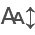

In [74]:
import itables.options as opt
from itables import init_notebook_mode

init_notebook_mode(all_interactive=True)
# To display
from itables import show

show(event)

In [75]:
from ydata_profiling import ProfileReport

# Create and display profile report
profile = ProfileReport(event, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [76]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(event, "event")

DataFrame successfully exported to MySQL database into table 'event'
Database connection closed.


In [77]:
event

Event_Id      Event_RecordId  Event_RecordName  \
0      00U8W00000YdbnuUAB  0123t000000AkRIAA0             Admin   
1      00U8W00000Ydbo9UAB  0123t000000NWciAAG             Event   
2      00U8W00000YdboaUAB  0123t000000AkRIAA0             Admin   
3      00U8W00000YdbokUAB  0123t000000AkRIAA0             Admin   
4      00U8W00000YdbopUAB  0123t000000AkQoAAK           Listing   
...                   ...                 ...               ...   
32110  00UWS000001TpEg2AK  0123t000000AkQjAAK  Market Appraisal   
32111  00UWS000001Ttmv2AC  0123t000000GCQPAA4        MB Viewing   
32112  00UWS000001TpY22AK  0123t000000NWcjAAG           Showing   
32113  00UWS000001TsAw2AK  0123t000000AkRNAA0          Mortgage   
32114  00UWS000001Tu1R2AS  0123t000000NWciAAG             Event   

                                           Event_Subject   Event_CreatedById  \
0                  Print off Jaspinder ID from Wed email  0053t000008UnQVAA0   
1                                     Aisha Mushtaq figs  0053t0000093zxhAAA   
2                              Chase Simpkin for VM docs  0053t000008UnQVAA0   
3                     Print P60s for Ross from Wed email  0053t000008UnQVAA0   
4                                                Listing  0053t000008UnRxAAK   
...                                                  ...                 ...   
32110                                   Market Appraisal  0058W00000FkwixQAB   
32111  ACMP Viewing:Timperley, Altrincham WA15 7SL  :...  0053t000008UptYAAS   
32112  ACMP Viewing:Ashton under Lyne OL7 9HA 47 Ambl...  0053t000008t8wgAAA   
32113                               Mortgage Appointment  0058W00000BZQ4dQAH   
32114                                   Post-Buffer Time  0058W00000BZQ4dQAH   

      Event_CreatedByName Event_Created_By_Staff Event_CreatedDate  \
0              Calum Begg                   None        2024-06-27   
1         William Whalley                   None        2024-06-27   
2              Calum Begg                   None        2024-06-27   
3              Calum Begg                   None        2024-06-27   
4              Fiona Feld                   None        2024-06-27   
...                   ...                    ...               ...   
32110       Alex Dallison                   None        2024-11-27   
32111      Mark Wilkinson                   None        2024-11-27   
32112        Freya Bashir                   None        2024-11-27   
32113    Richard Glithero     a3o8W000000lXQAQA2        2024-11-27   
32114    Richard Glithero                   None        2024-11-27   

        Event_EventType     Event_ListingId  Event_DurationInMinutes  \
0                  None                None                       60   
1                  None                None                       60   
2                  None                None                       60   
3                  None                None                       60   
4                  None  a0E8W00000fOcmbUAC                      120   
...                 ...                 ...                      ...   
32110  Market Appraisal                None                      120   
32111        MB Viewing  a0EWS0000039Zkn2AE                       60   
32112           Viewing  a0EWS000003Mjb72AC                       30   
32113              None                None                       60   
32114              None                None                       15   

         Event_ListingName Event_ListingPostCode Event_Office  \
0                      NaN                   NaN         None   
1                      NaN                   NaN         None   
2                      NaN                   NaN         None   
3                      NaN                   NaN         None   
4            9 Briar Grove               SK6 1QW      Woodley   
...                    ...                   ...          ...   
32110                  NaN                   NaN         None   
32111        1 Carlin Gat

### Listing

#### Rawl Listing

In [78]:
# Example usage
query = """
SELECT 
    Id,
    OwnerId,
    RecordTypeId,
    RecordType.Name,
    Name,
    Postcode__c,
    Office__c,
    Office__r.Name,
    pba__Property__r.Market_Area__r.Office__c,
    pba__Property__r.Market_Area__r.Office__r.Name,
    EA_Referral_Office__c,
    pba__ListingPrice_pb__c,
    pba__Status__c,
    Lister_Name__c,
    pba__ListedDate_pb__c,
    Valuation_Date__c,
    Withdrawn_Date__c,
    Calculated_Fee__c,
    Valuation_Cancelled__c,
    EA_Lister__c,
    EA_Lister__r.Name,
    EA_Lister_Profile__c,
    Estate_Agency_Referral__c,
    Estate_Agency_Referral__r.Name,
    Property_Auto_Reference__c
FROM
    pba__Listing__c
WHERE 
    (
        (pba__ListedDate_pb__c > 2024-06-27 OR 
         Withdrawn_Date__c > 2024-06-27 OR 
         Valuation_Date__c > 2024-06-27 OR 
         Valuation_Cancelled__c > 2024-06-27)
    ) 
    AND 
    (
        (RecordType.Name = 'Auction' AND 
         (EA_Lister__c != null OR Estate_Agency_Referral__c != null)
        ) 
        OR 
        (RecordType.Name = 'Sale')
    )

"""

df = export_salesforce_data(query)

# Display the DataFrame
df

Id             OwnerId        RecordTypeId  \
0     a0E3t00000OtS2gEAF  0053t000008UnRNAA0  0123t000000NWcZAAW   
1     a0E3t00000OtS3sEAF  0058W000009YBLkQAO  0123t000000NWcZAAW   
2     a0E3t00000OtSCdEAN  0053t000008UnRKAA0  0123t000000NWcZAAW   
3     a0E3t00000OtSMMEA3  0053t000008UnRCAA0  0123t000000NWcZAAW   
4     a0E3t00000OtSUaEAN  0058W000009YLc2QAG  0123t000000NWcZAAW   
...                  ...                 ...                 ...   
2234  a0EWS000003TWkP2AW  0058W00000ELrLBQA1  0123t000000NWcZAAW   
2235  a0EWS000003TXdC2AW  0058W00000E4t9IQAR  0123t000000NWcZAAW   
2236  a0EWS000003UMZJ2A4  0053t000008UnRCAA0  0123t000000NWcZAAW   
2237  a0EWS000003UWDe2AO  0058W00000Fkw6UQAR  0123t000000NWcZAAW   
2238  a0EWS000003Ucz02AC  0058W00000FkwixQAB  0123t000000NWcZAAW   

     RecordType.attributes.type  \
0                    RecordType   
1                    RecordType   
2                    RecordType   
3                    RecordType   
4                    RecordType   
...                         ...   
2234                 RecordType   
2235                 RecordType   
2236                 RecordType   
2237                 RecordType   
2238                 RecordType   

                              RecordType.attributes.url RecordType.Name  \
0     /services/data/v59.0/sobjects/RecordType/0123t...            Sale   
1     /services/data/v59.0/sobjects/RecordType/0123t...            Sale   
2     /services/data/v59.0/sobjects/RecordType/0123t...            Sale   
3     /services/data/v59.0/sobjects/RecordType/0123t...            Sale   
4     /services/data/v59.0/sobjects/RecordType/0123t...            Sale   
...                                                 ...             ...   
2234  /services/data/v59.0/sobjects/RecordType/0123t...            Sale   
2235  /services/data/v59.0/sobjects/RecordType/0123t...            Sale   
2236  /services/data/v59.0/sobjects/RecordType/0123t...            Sale   
2237  /services/data/v59.0/sobjects/RecordType/0123t...            Sale   
2238  /services/data/v59.0/sobjects/RecordType/0123t...            Sale   

                                 Name Postcode__c           Office__c  \
0                    21 Thornton Road     M14 7NU  a123t0000094bKCAAY   
1                   11 Scholars Drive     SK3 0BX  a123t0000094bJwAAI   
2                    24 Norbury Drive     SK6 6LL  a123t0000094bKMAAY   
3                42 St. Kildas Avenue     M43 7SF  a123t0000094bJrAAI   
4                     1 Morven Avenue     SK7 4QB  a123t0000094bKBAAY   
...                               ...         ...                 ...   
2234                    81 Kings Road     OL6 8JX  a123t0000094bJrAAI   
2235     15 Greenwood Close Audenshaw     M34 5UD  a123t0000094bJrAAI   
2236  Stanley House,  7 Monsall Road,     M35 9WN                None   
2237                 114 Strines Road     SK6 7DU  a123t0000094bKMAAY   
2238                73 Chatham Street     SK3 9EG  a123t0000094bKBAAY   

     Office__r.attributes.type  \
0               pba__Office__c   
1               pba__Office__c   
2               pba__Office__c   
3               pba__Office__c   
4               pba__Office__c   
...                        ...   
2234            pba__Office__c   
2235            pba__Office__c   
2236                       NaN   
2237            pba__Office__c   
2238            pba__Office__c   

                               Office__r.attributes.url Office__r.Name  \
0     /services/data/v59.0/sobjects/pba__Office__c/a...    Levenshulme   
1     /services/data/v59.0/sobjects/pba__Office__c/a...        Edgeley   
2     /services/data/v59.0/sobjects/pba__Office__c/a...         Marple   
3     /services/data/v59.0/sobjects/pba__Office__c/a...      Droylsden   
4     /services/data/v59.0/sobjects/pba__Office__c/a...    Hazel Grove   
...                                                 ...            ...   
2234  /services/data/v59.0/sobjects/pba__Office__c/a...      Droylsden   
2235 

In [79]:
df.dtypes

Id                                                            object
OwnerId                                                       object
RecordTypeId                                                  object
RecordType.attributes.type                                    object
RecordType.attributes.url                                     object
RecordType.Name                                               object
Name                                                          object
Postcode__c                                                   object
Office__c                                                     object
Office__r.attributes.type                                     object
Office__r.attributes.url                                      object
Office__r.Name                                                object
pba__Property__r.attributes.type                              object
pba__Property__r.attributes.url                               object
pba__Property__r.Market_Area__r.attributes.type               object
pba__Property__r.Market_Area__r.attributes.url                object
pba__Property__r.Market_Area__r.Office__c                     object
pba__Property__r.Market_Area__r.Office__r.attributes.type     object
pba__Property__r.Market_Area__r.Office__r.attributes.url      object
pba__Property__r.Market_Area__r.Office__r.Name                object
EA_Referral_Office__c                                         object
pba__ListingPrice_pb__c                                      float64
pba__Status__c                                                object
Lister_Name__c                                                object
pba__ListedDate_pb__c                                         object
Valuation_Date__c                                             object
Withdrawn_Date__c                                             object
Calculated_Fee__c                                            float64
Valuation_Cancelled__c                                        object
EA_Lister__c                                                  object
EA_Lister__r                                                 float64
EA_Lister_Profile__c                                          object
Estate_Agency_Referral__c                                     object
Estate_Agency_Referral__r                                    float64
property_auto_reference__c                                    object
EA_Lister__r.attributes.type                                  object
EA_Lister__r.attributes.url                                   object
EA_Lister__r.Name                                             object
Estate_Agency_Referral__r.attributes.type                     object
Estate_Agency_Referral__r.attributes.url                      object
Estate_Agency_Referral__r.Name                                object
pba__Property__r.Market_Area__r                              float64
pba__Property__r.Market_Area__r.Office__r                    float64
Office__r                                                    float64
dtype: object

In [80]:
Listing = df[
    [
        "Id",
        "OwnerId",
        "Name",
        "Postcode__c",
        "RecordType.Name",
        "Office__c",
        "Office__r.Name",
        "pba__ListingPrice_pb__c",
        "pba__Property__r.Market_Area__r.Office__c",
        "pba__Property__r.Market_Area__r.Office__r.Name",
        "EA_Lister__c",
        "EA_Lister__r.Name",
        "EA_Lister_Profile__c",
        "Estate_Agency_Referral__c",
        "Estate_Agency_Referral__r.Name",
        "Lister_Name__c",
        "pba__Status__c",
        "pba__ListedDate_pb__c",
        "Valuation_Date__c",
        "Withdrawn_Date__c",
        "Calculated_Fee__c",
        "Valuation_Cancelled__c",
        "property_auto_reference__c",
    ]
].copy()


# Rename the columns
# Correct the column renaming dictionary
Listing.rename(
    columns={
        "Id": "Listing_Id",
        "OwnerId": "Listing_OwnerId",
        "Name": "Listing_Address",
        "Postcode__c": "Listing_PropertyPostcode",
        "RecordType.Name": "Listing_RecordType",
        "Office__c": "Listing_OfficeCode",
        "Office__r.Name": "Listing_OfficeName",
        "pba__Property__r.Market_Area__r.Office__c": "Listing_PostCodeofficeId",
        "pba__Property__r.Market_Area__r.Office__r.Name": "Listing_PostCodeofficeName",
        "EA_Lister__c": "Listing_EAListerId",
        "EA_Lister__r.Name": "Listing_EAListerName",
        "EA_Lister_Profile__c": "Listing_EAListerProfile",
        "Estate_Agency_Referral__c": "Listing_ReferralId",
        "Estate_Agency_Referral__r.Name": "Listing_ReferralName",
        "pba__ListingPrice_pb__c": "Listing_ListingPrice",
        "pba__Status__c": "Listing_ListingStatus",
        "Lister_Name__c": "Listing_ListerId",
        "pba__ListedDate_pb__c": "Listing_ListingDate",
        "Valuation_Date__c": "Listing_ValuationDate",
        "Withdrawn_Date__c": "Listing_WithdrawnDate",
        "Valuation_Cancelled__c": "Listing_ValuationCancellationDate",
        "Calculated_Fee__c": "Listing_Fee",
        "property_auto_reference__c": "Property_Auto_Reference",
    },
    inplace=True,
)


Listing = convert_to_datetime_or_date(
    Listing, ["Listing_ListingDate"], format_type="date"
).copy()
Listing = convert_to_datetime_or_date(
    Listing, ["Listing_ValuationDate"], format_type="date"
).copy()
Listing = convert_to_datetime_or_date(
    Listing, ["Listing_WithdrawnDate"], format_type="date"
).copy()
Listing = convert_to_datetime_or_date(
    Listing, ["Listing_ValuationCancellationDate"], format_type="date"
).copy()
# print( Listing.dtypes)
Listing

Listing_Id     Listing_OwnerId                  Listing_Address  \
0     a0E3t00000OtS2gEAF  0053t000008UnRNAA0                 21 Thornton Road   
1     a0E3t00000OtS3sEAF  0058W000009YBLkQAO                11 Scholars Drive   
2     a0E3t00000OtSCdEAN  0053t000008UnRKAA0                 24 Norbury Drive   
3     a0E3t00000OtSMMEA3  0053t000008UnRCAA0             42 St. Kildas Avenue   
4     a0E3t00000OtSUaEAN  0058W000009YLc2QAG                  1 Morven Avenue   
...                  ...                 ...                              ...   
2234  a0EWS000003TWkP2AW  0058W00000ELrLBQA1                    81 Kings Road   
2235  a0EWS000003TXdC2AW  0058W00000E4t9IQAR     15 Greenwood Close Audenshaw   
2236  a0EWS000003UMZJ2A4  0053t000008UnRCAA0  Stanley House,  7 Monsall Road,   
2237  a0EWS000003UWDe2AO  0058W00000Fkw6UQAR                 114 Strines Road   
2238  a0EWS000003Ucz02AC  0058W00000FkwixQAB                73 Chatham Street   

     Listing_PropertyPostcode Listing_RecordType  Listing_OfficeCode  \
0                     M14 7NU               Sale  a123t0000094bKCAAY   
1                     SK3 0BX               Sale  a123t0000094bJwAAI   
2                     SK6 6LL               Sale  a123t0000094bKMAAY   
3                     M43 7SF               Sale  a123t0000094bJrAAI   
4                     SK7 4QB               Sale  a123t0000094bKBAAY   
...                       ...                ...                 ...   
2234                  OL6 8JX               Sale  a123t0000094bJrAAI   
2235                  M34 5UD               Sale  a123t0000094bJrAAI   
2236                  M35 9WN               Sale                None   
2237                  SK6 7DU               Sale  a123t0000094bKMAAY   
2238                  SK3 9EG               Sale  a123t0000094bKBAAY   

     Listing_OfficeName  Listing_ListingPrice Listing_PostCodeofficeId  \
0           Levenshulme                   NaN       a123t0000094bKCAAY   
1               Edgeley              330000.0       a123t0000094bJwAAI   
2                Marple                   NaN       a123t0000094bKMAAY   
3             Droylsden                   0.0       a123t0000094bJrAAI   
4           Hazel Grove              415000.0       a123t0000094bKBAAY   
...                 ...                   ...                      ...   
2234          Droylsden                   NaN       a123t0000094bKGAAY   
2235          Droylsden                   NaN       a123t0000094bJrAAI   
2236                NaN                   NaN       a123t0000094bJrAAI   
2237             Marple                   NaN       a123t0000094bKMAAY   
2238        Hazel Grove                   NaN       a123t0000094bJwAAI   

     Listing_PostCodeofficeName Listing_EAListerId Listing_EAListerName  \
0                   Levenshulme               None                  NaN   
1                       Edgeley               None                  NaN   
2                        Marple               None                  NaN   
3                     Droylsden               None                  NaN   
4                   Hazel Grove               None                  NaN   
...                         ...                ...                  ...   
2234                       Hyde               None                  NaN   
2235                  Droylsden               None                  NaN   
2236                  Droylsden               None                  NaN   
2237                     Marple               None                  NaN   
2238                    Edgeley               None                  NaN   

     Listing_EAListerProfile Listing_ReferralId Listing_ReferralName  \
0                       None               None                  NaN   
1                       None               None                  NaN   
2                       None               None                  NaN   
3                       None               None                  NaN   
4                       No

#### Listing Table Flagging

In [81]:
today = pd.Timestamp.today()


# Listing Flag
Listing["Flag_Listing"] = np.where(
    (Listing["Listing_RecordType"] == "Sale")
    & (
        Listing["Listing_ListingStatus"].isin(
            [
                "Available",
                "For Sale",
                "Low Profile",
                "Notice Given",
                "On Hold",
                "Referred (WD)",
                "SSTC",
                "Exchanged",
                "Completed",
            ]
        )
    ),
    1,
    0,
)

# Listing Fee
Listing["Flag_ListingFee"] = np.where(
    Listing["Flag_Listing"] == 1, Listing["Listing_Fee"], 0
)


# Listing Withdrawn Flag

Listing.loc[:, "Flag_Withdrawn"] = np.where(
    Listing["Listing_WithdrawnDate"].notna()
    & (Listing["Listing_RecordType"] == "Sale"),
    1,
    0,
)

# Listing Withdrawn Fee

Listing.loc[:, "Flag_WithdrawnFee"] = np.where(
    Listing.loc[:, "Flag_Withdrawn"] == 1, Listing["Listing_Fee"], 0
)


# Auction Instruction Flag
# Ensure EA_Lister_Id is not null or empty and Listing_RecordType is "Auction"
Listing.loc[:, "Flag_ListingAuctionInstruction"] = np.where(
    Listing["Listing_EAListerId"].notna()
    & (Listing["Listing_EAListerId"].str.strip() != "")
    & (Listing["Listing_RecordType"] == "Auction"),
    1,
    0,
)
# Auction Instruction Fee
# Ensure EA_Lister_Id is not null or empty and Listing_RecordType is "Auction"
Listing["Flag_ListingAuctionInstructionFee"] = np.where(
    Listing["Flag_ListingAuctionInstruction"] == 1, Listing["Listing_Fee"], 0
)


# Auction Referral Flag
# Ensure Referral_Id is not null or empty
Listing.loc[:, "Flag_ListingAuctionReferral"] = np.where(
    Listing["Listing_ReferralId"].notna()
    & (Listing["Listing_ReferralId"].str.strip() != "")
    & (Listing["Listing_RecordType"] == "Auction"),
    1,
    0,
)


# Auction Referral Fee
# Ensure Referral_Id is not null or empty
Listing.loc[:, "Flag_ListingAuctionReferralFee"] = np.where(
    Listing["Flag_ListingAuctionReferral"] == 1, Listing["Listing_Fee"], 0
)

# Valuation & Cancellation Flag
Listing.loc[:, "Flag_Valuation"] = np.where(
    Listing["Listing_ValuationDate"].notna(), 1, 0
)
Listing.loc[:, "Flag_ValuationCancellation"] = np.where(
    Listing["Listing_ValuationCancellationDate"].notna(), 1, 0
)

Listing

Listing_Id     Listing_OwnerId                  Listing_Address  \
0     a0E3t00000OtS2gEAF  0053t000008UnRNAA0                 21 Thornton Road   
1     a0E3t00000OtS3sEAF  0058W000009YBLkQAO                11 Scholars Drive   
2     a0E3t00000OtSCdEAN  0053t000008UnRKAA0                 24 Norbury Drive   
3     a0E3t00000OtSMMEA3  0053t000008UnRCAA0             42 St. Kildas Avenue   
4     a0E3t00000OtSUaEAN  0058W000009YLc2QAG                  1 Morven Avenue   
...                  ...                 ...                              ...   
2234  a0EWS000003TWkP2AW  0058W00000ELrLBQA1                    81 Kings Road   
2235  a0EWS000003TXdC2AW  0058W00000E4t9IQAR     15 Greenwood Close Audenshaw   
2236  a0EWS000003UMZJ2A4  0053t000008UnRCAA0  Stanley House,  7 Monsall Road,   
2237  a0EWS000003UWDe2AO  0058W00000Fkw6UQAR                 114 Strines Road   
2238  a0EWS000003Ucz02AC  0058W00000FkwixQAB                73 Chatham Street   

     Listing_PropertyPostcode Listing_RecordType  Listing_OfficeCode  \
0                     M14 7NU               Sale  a123t0000094bKCAAY   
1                     SK3 0BX               Sale  a123t0000094bJwAAI   
2                     SK6 6LL               Sale  a123t0000094bKMAAY   
3                     M43 7SF               Sale  a123t0000094bJrAAI   
4                     SK7 4QB               Sale  a123t0000094bKBAAY   
...                       ...                ...                 ...   
2234                  OL6 8JX               Sale  a123t0000094bJrAAI   
2235                  M34 5UD               Sale  a123t0000094bJrAAI   
2236                  M35 9WN               Sale                None   
2237                  SK6 7DU               Sale  a123t0000094bKMAAY   
2238                  SK3 9EG               Sale  a123t0000094bKBAAY   

     Listing_OfficeName  Listing_ListingPrice Listing_PostCodeofficeId  \
0           Levenshulme                   NaN       a123t0000094bKCAAY   
1               Edgeley              330000.0       a123t0000094bJwAAI   
2                Marple                   NaN       a123t0000094bKMAAY   
3             Droylsden                   0.0       a123t0000094bJrAAI   
4           Hazel Grove              415000.0       a123t0000094bKBAAY   
...                 ...                   ...                      ...   
2234          Droylsden                   NaN       a123t0000094bKGAAY   
2235          Droylsden                   NaN       a123t0000094bJrAAI   
2236                NaN                   NaN       a123t0000094bJrAAI   
2237             Marple                   NaN       a123t0000094bKMAAY   
2238        Hazel Grove                   NaN       a123t0000094bJwAAI   

     Listing_PostCodeofficeName Listing_EAListerId Listing_EAListerName  \
0                   Levenshulme               None                  NaN   
1                       Edgeley               None                  NaN   
2                        Marple               None                  NaN   
3                     Droylsden               None                  NaN   
4                   Hazel Grove               None                  NaN   
...                         ...                ...                  ...   
2234                       Hyde               None                  NaN   
2235                  Droylsden               None                  NaN   
2236                  Droylsden               None                  NaN   
2237                     Marple               None                  NaN   
2238                    Edgeley               None                  NaN   

     Listing_EAListerProfile Listing_ReferralId Listing_ReferralName  \
0                       None               None                  NaN   
1                       None               None                  NaN   
2                       None               None                  NaN   
3                       None               None                  NaN   
4                       No

#### Mod Owner Id/VPM

In [82]:
Listing["Mod_Listing_OwnerId"] = np.where(
    Listing["Listing_EAListerId"].notna()
    & (Listing["Listing_EAListerId"].str.strip() != "")
    & (Listing["Listing_RecordType"] == "Auction"),
    Listing["Listing_EAListerId"],
    np.where(
        Listing["Listing_ReferralId"].notna()
        & (Listing["Listing_ReferralId"].str.strip() != "")
        & (Listing["Listing_RecordType"] == "Auction"),
        Listing["Listing_ReferralId"],
        Listing["Listing_OwnerId"],
    ),
)
Listing

Listing_Id     Listing_OwnerId                  Listing_Address  \
0     a0E3t00000OtS2gEAF  0053t000008UnRNAA0                 21 Thornton Road   
1     a0E3t00000OtS3sEAF  0058W000009YBLkQAO                11 Scholars Drive   
2     a0E3t00000OtSCdEAN  0053t000008UnRKAA0                 24 Norbury Drive   
3     a0E3t00000OtSMMEA3  0053t000008UnRCAA0             42 St. Kildas Avenue   
4     a0E3t00000OtSUaEAN  0058W000009YLc2QAG                  1 Morven Avenue   
...                  ...                 ...                              ...   
2234  a0EWS000003TWkP2AW  0058W00000ELrLBQA1                    81 Kings Road   
2235  a0EWS000003TXdC2AW  0058W00000E4t9IQAR     15 Greenwood Close Audenshaw   
2236  a0EWS000003UMZJ2A4  0053t000008UnRCAA0  Stanley House,  7 Monsall Road,   
2237  a0EWS000003UWDe2AO  0058W00000Fkw6UQAR                 114 Strines Road   
2238  a0EWS000003Ucz02AC  0058W00000FkwixQAB                73 Chatham Street   

     Listing_PropertyPostcode Listing_RecordType  Listing_OfficeCode  \
0                     M14 7NU               Sale  a123t0000094bKCAAY   
1                     SK3 0BX               Sale  a123t0000094bJwAAI   
2                     SK6 6LL               Sale  a123t0000094bKMAAY   
3                     M43 7SF               Sale  a123t0000094bJrAAI   
4                     SK7 4QB               Sale  a123t0000094bKBAAY   
...                       ...                ...                 ...   
2234                  OL6 8JX               Sale  a123t0000094bJrAAI   
2235                  M34 5UD               Sale  a123t0000094bJrAAI   
2236                  M35 9WN               Sale                None   
2237                  SK6 7DU               Sale  a123t0000094bKMAAY   
2238                  SK3 9EG               Sale  a123t0000094bKBAAY   

     Listing_OfficeName  Listing_ListingPrice Listing_PostCodeofficeId  \
0           Levenshulme                   NaN       a123t0000094bKCAAY   
1               Edgeley              330000.0       a123t0000094bJwAAI   
2                Marple                   NaN       a123t0000094bKMAAY   
3             Droylsden                   0.0       a123t0000094bJrAAI   
4           Hazel Grove              415000.0       a123t0000094bKBAAY   
...                 ...                   ...                      ...   
2234          Droylsden                   NaN       a123t0000094bKGAAY   
2235          Droylsden                   NaN       a123t0000094bJrAAI   
2236                NaN                   NaN       a123t0000094bJrAAI   
2237             Marple                   NaN       a123t0000094bKMAAY   
2238        Hazel Grove                   NaN       a123t0000094bJwAAI   

     Listing_PostCodeofficeName Listing_EAListerId Listing_EAListerName  \
0                   Levenshulme               None                  NaN   
1                       Edgeley               None                  NaN   
2                        Marple               None                  NaN   
3                     Droylsden               None                  NaN   
4                   Hazel Grove               None                  NaN   
...                         ...                ...                  ...   
2234                       Hyde               None                  NaN   
2235                  Droylsden               None                  NaN   
2236                  Droylsden               None                  NaN   
2237                     Marple               None                  NaN   
2238                    Edgeley               None                  NaN   

     Listing_EAListerProfile Listing_ReferralId Listing_ReferralName  \
0                       None               None                  NaN   
1                       None               None                  NaN   
2                       None               None                  NaN   
3                       None               None                  NaN   
4                       No

#### Mod_Lister Id

In [83]:
Listing["Mod_Listing_ListerId"] = np.where(
    Listing["Listing_EAListerId"].notna()
    & (Listing["Listing_EAListerId"].str.strip() != "")
    & (Listing["Listing_RecordType"] == "Auction"),
    Listing["Listing_EAListerId"],
    np.where(
        Listing["Listing_ReferralId"].notna()
        & (Listing["Listing_ReferralId"].str.strip() != "")
        & (Listing["Listing_RecordType"] == "Auction"),
        Listing["Listing_ReferralId"],
        Listing["Listing_ListerId"],
    ),
)
Listing

Listing_Id     Listing_OwnerId                  Listing_Address  \
0     a0E3t00000OtS2gEAF  0053t000008UnRNAA0                 21 Thornton Road   
1     a0E3t00000OtS3sEAF  0058W000009YBLkQAO                11 Scholars Drive   
2     a0E3t00000OtSCdEAN  0053t000008UnRKAA0                 24 Norbury Drive   
3     a0E3t00000OtSMMEA3  0053t000008UnRCAA0             42 St. Kildas Avenue   
4     a0E3t00000OtSUaEAN  0058W000009YLc2QAG                  1 Morven Avenue   
...                  ...                 ...                              ...   
2234  a0EWS000003TWkP2AW  0058W00000ELrLBQA1                    81 Kings Road   
2235  a0EWS000003TXdC2AW  0058W00000E4t9IQAR     15 Greenwood Close Audenshaw   
2236  a0EWS000003UMZJ2A4  0053t000008UnRCAA0  Stanley House,  7 Monsall Road,   
2237  a0EWS000003UWDe2AO  0058W00000Fkw6UQAR                 114 Strines Road   
2238  a0EWS000003Ucz02AC  0058W00000FkwixQAB                73 Chatham Street   

     Listing_PropertyPostcode Listing_RecordType  Listing_OfficeCode  \
0                     M14 7NU               Sale  a123t0000094bKCAAY   
1                     SK3 0BX               Sale  a123t0000094bJwAAI   
2                     SK6 6LL               Sale  a123t0000094bKMAAY   
3                     M43 7SF               Sale  a123t0000094bJrAAI   
4                     SK7 4QB               Sale  a123t0000094bKBAAY   
...                       ...                ...                 ...   
2234                  OL6 8JX               Sale  a123t0000094bJrAAI   
2235                  M34 5UD               Sale  a123t0000094bJrAAI   
2236                  M35 9WN               Sale                None   
2237                  SK6 7DU               Sale  a123t0000094bKMAAY   
2238                  SK3 9EG               Sale  a123t0000094bKBAAY   

     Listing_OfficeName  Listing_ListingPrice Listing_PostCodeofficeId  \
0           Levenshulme                   NaN       a123t0000094bKCAAY   
1               Edgeley              330000.0       a123t0000094bJwAAI   
2                Marple                   NaN       a123t0000094bKMAAY   
3             Droylsden                   0.0       a123t0000094bJrAAI   
4           Hazel Grove              415000.0       a123t0000094bKBAAY   
...                 ...                   ...                      ...   
2234          Droylsden                   NaN       a123t0000094bKGAAY   
2235          Droylsden                   NaN       a123t0000094bJrAAI   
2236                NaN                   NaN       a123t0000094bJrAAI   
2237             Marple                   NaN       a123t0000094bKMAAY   
2238        Hazel Grove                   NaN       a123t0000094bJwAAI   

     Listing_PostCodeofficeName Listing_EAListerId Listing_EAListerName  \
0                   Levenshulme               None                  NaN   
1                       Edgeley               None                  NaN   
2                        Marple               None                  NaN   
3                     Droylsden               None                  NaN   
4                   Hazel Grove               None                  NaN   
...                         ...                ...                  ...   
2234                       Hyde               None                  NaN   
2235                  Droylsden               None                  NaN   
2236                  Droylsden               None                  NaN   
2237                     Marple               None                  NaN   
2238                    Edgeley               None                  NaN   

     Listing_EAListerProfile Listing_ReferralId Listing_ReferralName  \
0                       None               None                  NaN   
1                       None               None                  NaN   
2                       None               None                  NaN   
3                       None               None                  NaN   
4                       No

In [84]:
Listing.to_excel("Listing.xlsx")

#### Mod_Office

In [85]:
Listing["Listing_Mod_OfficeId"] = np.where(
    (Listing["Listing_EAListerId"].notna())
    & (Listing["Listing_EAListerId"].str.strip() != "")
    & (Listing["Listing_RecordType"] == "Auction"),
    Listing["Listing_PostCodeofficeId"],
    np.where(
        (Listing["Listing_ReferralId"].notna())
        & (Listing["Listing_ReferralId"].str.strip() != "")
        & (Listing["Listing_RecordType"] == "Auction"),
        Listing["Listing_PostCodeofficeId"],
        Listing["Listing_OfficeCode"],
    ),
)
Listing

Listing_Id     Listing_OwnerId                  Listing_Address  \
0     a0E3t00000OtS2gEAF  0053t000008UnRNAA0                 21 Thornton Road   
1     a0E3t00000OtS3sEAF  0058W000009YBLkQAO                11 Scholars Drive   
2     a0E3t00000OtSCdEAN  0053t000008UnRKAA0                 24 Norbury Drive   
3     a0E3t00000OtSMMEA3  0053t000008UnRCAA0             42 St. Kildas Avenue   
4     a0E3t00000OtSUaEAN  0058W000009YLc2QAG                  1 Morven Avenue   
...                  ...                 ...                              ...   
2234  a0EWS000003TWkP2AW  0058W00000ELrLBQA1                    81 Kings Road   
2235  a0EWS000003TXdC2AW  0058W00000E4t9IQAR     15 Greenwood Close Audenshaw   
2236  a0EWS000003UMZJ2A4  0053t000008UnRCAA0  Stanley House,  7 Monsall Road,   
2237  a0EWS000003UWDe2AO  0058W00000Fkw6UQAR                 114 Strines Road   
2238  a0EWS000003Ucz02AC  0058W00000FkwixQAB                73 Chatham Street   

     Listing_PropertyPostcode Listing_RecordType  Listing_OfficeCode  \
0                     M14 7NU               Sale  a123t0000094bKCAAY   
1                     SK3 0BX               Sale  a123t0000094bJwAAI   
2                     SK6 6LL               Sale  a123t0000094bKMAAY   
3                     M43 7SF               Sale  a123t0000094bJrAAI   
4                     SK7 4QB               Sale  a123t0000094bKBAAY   
...                       ...                ...                 ...   
2234                  OL6 8JX               Sale  a123t0000094bJrAAI   
2235                  M34 5UD               Sale  a123t0000094bJrAAI   
2236                  M35 9WN               Sale                None   
2237                  SK6 7DU               Sale  a123t0000094bKMAAY   
2238                  SK3 9EG               Sale  a123t0000094bKBAAY   

     Listing_OfficeName  Listing_ListingPrice Listing_PostCodeofficeId  \
0           Levenshulme                   NaN       a123t0000094bKCAAY   
1               Edgeley              330000.0       a123t0000094bJwAAI   
2                Marple                   NaN       a123t0000094bKMAAY   
3             Droylsden                   0.0       a123t0000094bJrAAI   
4           Hazel Grove              415000.0       a123t0000094bKBAAY   
...                 ...                   ...                      ...   
2234          Droylsden                   NaN       a123t0000094bKGAAY   
2235          Droylsden                   NaN       a123t0000094bJrAAI   
2236                NaN                   NaN       a123t0000094bJrAAI   
2237             Marple                   NaN       a123t0000094bKMAAY   
2238        Hazel Grove                   NaN       a123t0000094bJwAAI   

     Listing_PostCodeofficeName Listing_EAListerId Listing_EAListerName  \
0                   Levenshulme               None                  NaN   
1                       Edgeley               None                  NaN   
2                        Marple               None                  NaN   
3                     Droylsden               None                  NaN   
4                   Hazel Grove               None                  NaN   
...                         ...                ...                  ...   
2234                       Hyde               None                  NaN   
2235                  Droylsden               None                  NaN   
2236                  Droylsden               None                  NaN   
2237                     Marple               None                  NaN   
2238                    Edgeley               None                  NaN   

     Listing_EAListerProfile Listing_ReferralId Listing_ReferralName  \
0                       None               None                  NaN   
1                       None               None                  NaN   
2                       None               None                  NaN   
3                       None               None                  NaN   
4                       No

#### VPM Details

In [86]:
Listing = pd.merge(
    Listing, vpm, left_on="Listing_Mod_OfficeId", right_on="VPM_OfficeId", how="left"
)
Listing = Listing.drop(columns=["VPM_OfficeId"])
Listing.rename(
    columns={
        "VPM_Office": "Listing_VPM_OfficeName",
        "VPM_UserId": "Listing_VPM_UserId",
        "VPM_Name": "Listing_VPM_Name",
    },
    inplace=True,
)
Listing

Listing_Id     Listing_OwnerId                  Listing_Address  \
0     a0E3t00000OtS2gEAF  0053t000008UnRNAA0                 21 Thornton Road   
1     a0E3t00000OtS3sEAF  0058W000009YBLkQAO                11 Scholars Drive   
2     a0E3t00000OtSCdEAN  0053t000008UnRKAA0                 24 Norbury Drive   
3     a0E3t00000OtSMMEA3  0053t000008UnRCAA0             42 St. Kildas Avenue   
4     a0E3t00000OtSUaEAN  0058W000009YLc2QAG                  1 Morven Avenue   
...                  ...                 ...                              ...   
2234  a0EWS000003TWkP2AW  0058W00000ELrLBQA1                    81 Kings Road   
2235  a0EWS000003TXdC2AW  0058W00000E4t9IQAR     15 Greenwood Close Audenshaw   
2236  a0EWS000003UMZJ2A4  0053t000008UnRCAA0  Stanley House,  7 Monsall Road,   
2237  a0EWS000003UWDe2AO  0058W00000Fkw6UQAR                 114 Strines Road   
2238  a0EWS000003Ucz02AC  0058W00000FkwixQAB                73 Chatham Street   

     Listing_PropertyPostcode Listing_RecordType  Listing_OfficeCode  \
0                     M14 7NU               Sale  a123t0000094bKCAAY   
1                     SK3 0BX               Sale  a123t0000094bJwAAI   
2                     SK6 6LL               Sale  a123t0000094bKMAAY   
3                     M43 7SF               Sale  a123t0000094bJrAAI   
4                     SK7 4QB               Sale  a123t0000094bKBAAY   
...                       ...                ...                 ...   
2234                  OL6 8JX               Sale  a123t0000094bJrAAI   
2235                  M34 5UD               Sale  a123t0000094bJrAAI   
2236                  M35 9WN               Sale                None   
2237                  SK6 7DU               Sale  a123t0000094bKMAAY   
2238                  SK3 9EG               Sale  a123t0000094bKBAAY   

     Listing_OfficeName  Listing_ListingPrice Listing_PostCodeofficeId  \
0           Levenshulme                   NaN       a123t0000094bKCAAY   
1               Edgeley              330000.0       a123t0000094bJwAAI   
2                Marple                   NaN       a123t0000094bKMAAY   
3             Droylsden                   0.0       a123t0000094bJrAAI   
4           Hazel Grove              415000.0       a123t0000094bKBAAY   
...                 ...                   ...                      ...   
2234          Droylsden                   NaN       a123t0000094bKGAAY   
2235          Droylsden                   NaN       a123t0000094bJrAAI   
2236                NaN                   NaN       a123t0000094bJrAAI   
2237             Marple                   NaN       a123t0000094bKMAAY   
2238        Hazel Grove                   NaN       a123t0000094bJwAAI   

     Listing_PostCodeofficeName Listing_EAListerId Listing_EAListerName  \
0                   Levenshulme               None                  NaN   
1                       Edgeley               None                  NaN   
2                        Marple               None                  NaN   
3                     Droylsden               None                  NaN   
4                   Hazel Grove               None                  NaN   
...                         ...                ...                  ...   
2234                       Hyde               None                  NaN   
2235                  Droylsden               None                  NaN   
2236                  Droylsden               None                  NaN   
2237                     Marple               None                  NaN   
2238                    Edgeley               None                  NaN   

     Listing_EAListerProfile Listing_ReferralId Listing_ReferralName  \
0                       None               None                  NaN   
1                       None               None                  NaN   
2                       None               None                  NaN   
3                       None               None                  NaN   
4                       No

In [87]:
Listing.to_excel("Listing.xlsx")

#### Staff Details for OwnerID

In [88]:
Listing = pd.merge(
    Listing,
    Staff_Limited,
    left_on="Mod_Listing_OwnerId",
    right_on="Staff_UserId",
    how="left",
)
Listing = Listing.drop(columns=["Staff_UserId"])
Listing.rename(
    columns={
        "Staff_UserName": "Listing_Mod_OwnerName",
        "Staff_Title": "Listing_Mod_OwnerTitle",
    },
    inplace=True,
)
Listing

Listing_Id     Listing_OwnerId                  Listing_Address  \
0     a0E3t00000OtS2gEAF  0053t000008UnRNAA0                 21 Thornton Road   
1     a0E3t00000OtS3sEAF  0058W000009YBLkQAO                11 Scholars Drive   
2     a0E3t00000OtSCdEAN  0053t000008UnRKAA0                 24 Norbury Drive   
3     a0E3t00000OtSMMEA3  0053t000008UnRCAA0             42 St. Kildas Avenue   
4     a0E3t00000OtSUaEAN  0058W000009YLc2QAG                  1 Morven Avenue   
...                  ...                 ...                              ...   
2234  a0EWS000003TWkP2AW  0058W00000ELrLBQA1                    81 Kings Road   
2235  a0EWS000003TXdC2AW  0058W00000E4t9IQAR     15 Greenwood Close Audenshaw   
2236  a0EWS000003UMZJ2A4  0053t000008UnRCAA0  Stanley House,  7 Monsall Road,   
2237  a0EWS000003UWDe2AO  0058W00000Fkw6UQAR                 114 Strines Road   
2238  a0EWS000003Ucz02AC  0058W00000FkwixQAB                73 Chatham Street   

     Listing_PropertyPostcode Listing_RecordType  Listing_OfficeCode  \
0                     M14 7NU               Sale  a123t0000094bKCAAY   
1                     SK3 0BX               Sale  a123t0000094bJwAAI   
2                     SK6 6LL               Sale  a123t0000094bKMAAY   
3                     M43 7SF               Sale  a123t0000094bJrAAI   
4                     SK7 4QB               Sale  a123t0000094bKBAAY   
...                       ...                ...                 ...   
2234                  OL6 8JX               Sale  a123t0000094bJrAAI   
2235                  M34 5UD               Sale  a123t0000094bJrAAI   
2236                  M35 9WN               Sale                None   
2237                  SK6 7DU               Sale  a123t0000094bKMAAY   
2238                  SK3 9EG               Sale  a123t0000094bKBAAY   

     Listing_OfficeName  Listing_ListingPrice Listing_PostCodeofficeId  \
0           Levenshulme                   NaN       a123t0000094bKCAAY   
1               Edgeley              330000.0       a123t0000094bJwAAI   
2                Marple                   NaN       a123t0000094bKMAAY   
3             Droylsden                   0.0       a123t0000094bJrAAI   
4           Hazel Grove              415000.0       a123t0000094bKBAAY   
...                 ...                   ...                      ...   
2234          Droylsden                   NaN       a123t0000094bKGAAY   
2235          Droylsden                   NaN       a123t0000094bJrAAI   
2236                NaN                   NaN       a123t0000094bJrAAI   
2237             Marple                   NaN       a123t0000094bKMAAY   
2238        Hazel Grove                   NaN       a123t0000094bJwAAI   

     Listing_PostCodeofficeName Listing_EAListerId Listing_EAListerName  \
0                   Levenshulme               None                  NaN   
1                       Edgeley               None                  NaN   
2                        Marple               None                  NaN   
3                     Droylsden               None                  NaN   
4                   Hazel Grove               None                  NaN   
...                         ...                ...                  ...   
2234                       Hyde               None                  NaN   
2235                  Droylsden               None                  NaN   
2236                  Droylsden               None                  NaN   
2237                     Marple               None                  NaN   
2238                    Edgeley               None                  NaN   

     Listing_EAListerProfile Listing_ReferralId Listing_ReferralName  \
0                       None               None                  NaN   
1                       None               None                  NaN   
2                       None               None                  NaN   
3                       None               None                  NaN   
4                       No

#### Lister ID User Details

In [89]:
Listing = pd.merge(
    Listing,
    Staff_Limited,
    left_on="Mod_Listing_ListerId",
    right_on="Staff_UserId",
    how="left",
)
Listing = Listing.drop(columns=["Staff_UserId"])
Listing.rename(
    columns={
        "Staff_UserName": "Listing_Mod_ListerName",
        "Staff_Title": "Listing_Mod_ListerTitle",
    },
    inplace=True,
)
Listing

Listing_Id     Listing_OwnerId                  Listing_Address  \
0     a0E3t00000OtS2gEAF  0053t000008UnRNAA0                 21 Thornton Road   
1     a0E3t00000OtS3sEAF  0058W000009YBLkQAO                11 Scholars Drive   
2     a0E3t00000OtSCdEAN  0053t000008UnRKAA0                 24 Norbury Drive   
3     a0E3t00000OtSMMEA3  0053t000008UnRCAA0             42 St. Kildas Avenue   
4     a0E3t00000OtSUaEAN  0058W000009YLc2QAG                  1 Morven Avenue   
...                  ...                 ...                              ...   
2234  a0EWS000003TWkP2AW  0058W00000ELrLBQA1                    81 Kings Road   
2235  a0EWS000003TXdC2AW  0058W00000E4t9IQAR     15 Greenwood Close Audenshaw   
2236  a0EWS000003UMZJ2A4  0053t000008UnRCAA0  Stanley House,  7 Monsall Road,   
2237  a0EWS000003UWDe2AO  0058W00000Fkw6UQAR                 114 Strines Road   
2238  a0EWS000003Ucz02AC  0058W00000FkwixQAB                73 Chatham Street   

     Listing_PropertyPostcode Listing_RecordType  Listing_OfficeCode  \
0                     M14 7NU               Sale  a123t0000094bKCAAY   
1                     SK3 0BX               Sale  a123t0000094bJwAAI   
2                     SK6 6LL               Sale  a123t0000094bKMAAY   
3                     M43 7SF               Sale  a123t0000094bJrAAI   
4                     SK7 4QB               Sale  a123t0000094bKBAAY   
...                       ...                ...                 ...   
2234                  OL6 8JX               Sale  a123t0000094bJrAAI   
2235                  M34 5UD               Sale  a123t0000094bJrAAI   
2236                  M35 9WN               Sale                None   
2237                  SK6 7DU               Sale  a123t0000094bKMAAY   
2238                  SK3 9EG               Sale  a123t0000094bKBAAY   

     Listing_OfficeName  Listing_ListingPrice Listing_PostCodeofficeId  \
0           Levenshulme                   NaN       a123t0000094bKCAAY   
1               Edgeley              330000.0       a123t0000094bJwAAI   
2                Marple                   NaN       a123t0000094bKMAAY   
3             Droylsden                   0.0       a123t0000094bJrAAI   
4           Hazel Grove              415000.0       a123t0000094bKBAAY   
...                 ...                   ...                      ...   
2234          Droylsden                   NaN       a123t0000094bKGAAY   
2235          Droylsden                   NaN       a123t0000094bJrAAI   
2236                NaN                   NaN       a123t0000094bJrAAI   
2237             Marple                   NaN       a123t0000094bKMAAY   
2238        Hazel Grove                   NaN       a123t0000094bJwAAI   

     Listing_PostCodeofficeName Listing_EAListerId Listing_EAListerName  \
0                   Levenshulme               None                  NaN   
1                       Edgeley               None                  NaN   
2                        Marple               None                  NaN   
3                     Droylsden               None                  NaN   
4                   Hazel Grove               None                  NaN   
...                         ...                ...                  ...   
2234                       Hyde               None                  NaN   
2235                  Droylsden               None                  NaN   
2236                  Droylsden               None                  NaN   
2237                     Marple               None                  NaN   
2238                    Edgeley               None                  NaN   

     Listing_EAListerProfile Listing_ReferralId Listing_ReferralName  \
0                       None               None                  NaN   
1                       None               None                  NaN   
2                       None               None                  NaN   
3                       None               None                  NaN   
4                       No

In [90]:
Listing_Reorder = [
    "Listing_Id",
    "Listing_ListingStatus",
    "Property_Auto_Reference",
    "Listing_Address",
    "Listing_PropertyPostcode",
    "Listing_RecordType",
    "Listing_ListingDate",
    "Listing_ValuationDate",
    "Listing_WithdrawnDate",
    "Listing_ValuationCancellationDate",
    "Listing_ListingPrice",
    "Listing_Fee",
    "Flag_Listing",
    "Flag_ListingFee",
    "Flag_Withdrawn",
    "Flag_WithdrawnFee",
    "Flag_ListingAuctionInstruction",
    "Flag_ListingAuctionInstructionFee",
    "Flag_ListingAuctionReferral",
    "Flag_ListingAuctionReferralFee",
    "Flag_Valuation",
    "Flag_ValuationCancellation",
    "Listing_OfficeCode",
    "Listing_OfficeName",
    "Listing_Mod_OfficeId",
    "Listing_VPM_OfficeName",
    "Listing_EAListerId",
    "Listing_EAListerName",
    "Listing_EAListerProfile",
    "Listing_ReferralId",
    "Listing_ReferralName",
    "Listing_OwnerId",
    "Mod_Listing_OwnerId",
    "Listing_Mod_OwnerName",
    "Listing_Mod_OwnerTitle",
    "Listing_ListerId",
    "Mod_Listing_ListerId",
    "Listing_Mod_ListerName",
    "Listing_Mod_ListerTitle",
    "Listing_VPM_UserId",
    "Listing_VPM_Name",
]
Listing = Listing[Listing_Reorder]
Listing

Listing_Id Listing_ListingStatus Property_Auto_Reference  \
0     a0E3t00000OtS2gEAF                    MA            21M147NU0000   
1     a0E3t00000OtS3sEAF             Withdrawn            11SK30BX0000   
2     a0E3t00000OtSCdEAN                    MA            24SK66LL0000   
3     a0E3t00000OtSMMEA3                    MA            42M437SF0000   
4     a0E3t00000OtSUaEAN                    MA            1SK74QB00000   
...                  ...                   ...                     ...   
2234  a0EWS000003TWkP2AW                    MA            81OL68JX0000   
2235  a0EWS000003TXdC2AW                    MA            15M345UD0000   
2236  a0EWS000003UMZJ2A4                    MA           StanleyM359WN   
2237  a0EWS000003UWDe2AO                    MA            114SK67DU000   
2238  a0EWS000003Ucz02AC                    MA            73SK39EG0000   

                      Listing_Address Listing_PropertyPostcode  \
0                    21 Thornton Road                  M14 7NU   
1                   11 Scholars Drive                  SK3 0BX   
2                    24 Norbury Drive                  SK6 6LL   
3                42 St. Kildas Avenue                  M43 7SF   
4                     1 Morven Avenue                  SK7 4QB   
...                               ...                      ...   
2234                    81 Kings Road                  OL6 8JX   
2235     15 Greenwood Close Audenshaw                  M34 5UD   
2236  Stanley House,  7 Monsall Road,                  M35 9WN   
2237                 114 Strines Road                  SK6 7DU   
2238                73 Chatham Street                  SK3 9EG   

     Listing_RecordType Listing_ListingDate Listing_ValuationDate  \
0                  Sale                 NaT            2024-10-10   
1                  Sale          2023-07-13            2023-07-06   
2                  Sale                 NaT            2024-07-05   
3                  Sale                 NaT            2024-11-19   
4                  Sale                 NaT            2024-08-01   
...                 ...                 ...                   ...   
2234               Sale                 NaT            2024-12-04   
2235               Sale                 NaT            2024-11-29   
2236               Sale                 NaT            2024-11-27   
2237               Sale                 NaT            2024-12-04   
2238               Sale                 NaT            2024-11-29   

     Listing_WithdrawnDate Listing_ValuationCancellationDate  \
0                      NaT                               NaT   
1               2024-08-28                               NaT   
2                      NaT                               NaT   
3                      NaT                               NaT   
4                      NaT                               NaT   
...                    ...                               ...   
2234                   NaT                               NaT   
2235                   NaT                               NaT   
2236                   NaT                               NaT   
2237                   NaT                               NaT   
2238                   NaT                               NaT   

      Listing_ListingPrice  Listing_Fee  Flag_Listing  Flag_ListingFee  \
0                      NaN          0.0             0              0.0   
1                 330000.0       3300.0             0              0.0   
2                      NaN          0.0             0              0.0   
3                      0.0       2500.0             0              0.0   
4                 415000.0          0.0             0              0.0   
...                    ...          ...           ...              ...   
2234                   NaN          0.0             0              0.0   
2235                   NaN          0.0             0              0.0   
2236                   NaN          0.0             0              0

In [91]:
Listing.dtypes

Listing_Id                                   object
Listing_ListingStatus                        object
Property_Auto_Reference                      object
Listing_Address                              object
Listing_PropertyPostcode                     object
Listing_RecordType                           object
Listing_ListingDate                  datetime64[ns]
Listing_ValuationDate                datetime64[ns]
Listing_WithdrawnDate                datetime64[ns]
Listing_ValuationCancellationDate    datetime64[ns]
Listing_ListingPrice                        float64
Listing_Fee                                 float64
Flag_Listing                                  int64
Flag_ListingFee                             float64
Flag_Withdrawn                                int64
Flag_WithdrawnFee                           float64
Flag_ListingAuctionInstruction                int64
Flag_ListingAuctionInstructionFee           float64
Flag_ListingAuctionReferral                   int64
Flag_ListingAuctionReferralFee              float64
Flag_Valuation                                int64
Flag_ValuationCancellation                    int64
Listing_OfficeCode                           object
Listing_OfficeName                           object
Listing_Mod_OfficeId                         object
Listing_VPM_OfficeName                       object
Listing_EAListerId                           object
Listing_EAListerName                         object
Listing_EAListerProfile                      object
Listing_ReferralId                           object
Listing_ReferralName                         object
Listing_OwnerId                              object
Mod_Listing_OwnerId                          object
Listing_Mod_OwnerName                        object
Listing_Mod_OwnerTitle                       object
Listing_ListerId                             object
Mod_Listing_ListerId                         object
Listing_Mod_ListerName                       object
Listing_Mod_ListerTitle                      object
Listing_VPM_UserId                           object
Listing_VPM_Name                             object
dtype: object

#### Summary

In [92]:
print_column_sums(
    Listing,
    "Flag_Listing",
    "Flag_Withdrawn",
    "Flag_ListingAuctionInstruction",
    "Flag_ListingAuctionReferral",
    "Flag_Valuation",
    "Flag_ValuationCancellation",
)

Column 'Flag_Listing' number = 701
Column 'Flag_Withdrawn' number = 234
Column 'Flag_ListingAuctionInstruction' number = 51
Column 'Flag_ListingAuctionReferral' number = 48
Column 'Flag_Valuation' number = 2074
Column 'Flag_ValuationCancellation' number = 124


In [93]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(Listing, "Listing")

C:\Users\srigd\AppData\Local\Temp\1\ipykernel_13840\3400538508.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = pd.to_datetime(df[column]).dt.date
C:\Users\srigd\AppData\Local\Temp\1\ipykernel_13840\3400538508.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = pd.to_datetime(df[column]).dt.date
C:\Users\srigd\AppData\Local\Temp\1\ipykernel_13840\3400538508.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

DataFrame successfully exported to MySQL database into table 'Listing'
Database connection closed.


#### Exception Details

In [94]:
# 1. Post Code office & Listing Office is not matching-Need to see
# .2.VPM is not matching for the office against the owner ID
# owner ID is not VPM
# Owner ID is not equal to VPM
# VPM Not Listed
# Post code not giving any office, even though there is an auction there should be some branch from where it is referred or instructed

### Closing

#### Raw Closing

In [95]:
query = """
SELECT
    Id,
    pba__Listing__c, 
    OwnerId,
    pba__Listing__r.OwnerId, 
    pba__Offer__r.OwnerId,
    
    Name,
        pba__Listing__r.Name,
    pba__Listing__r.Postcode__c,
    
    pba__Listing__r.Lister_Name__c,
    RecordTypeId,
    RecordType.Name,
    
    pba__Listing__r.Office__c,
    pba__Listing__r.Office__r.Name,
    pba__Listing__r.CALC_Estate_Office_ID__c,

    pba__Listing__r.pba__Property__r.Market_Area__r.Office__c,
    pba__Listing__r.pba__Property__r.Market_Area__r.Office__r.Name,
    
    CreatedById,
    
    CreatedDate,
   pba__Listing__r.pba__ListedDate_pb__c, 
    Completion_date__c,
    Fee_Received_Date__c,
    Sale_Fallen_Through__c,
    
    Closing_Status__c,
    
    Sale_Price__c,
    Percentage_Selling_Fee__c,
    Calculated_Fee__c,
    Fee_Received_Amount__c, 
    
    FLAG_6_Week_sale__c,
    
    pba__Listing__r.EA_Lister__c,
    pba__Listing__r.EA_Lister__r.Name,
    pba__Listing__r.Estate_Agency_Referral__c,
    pba__Listing__r.Estate_Agency_Referral__r.Name,
    Buying_Advisor__c,
    
    Property_Auto_Reference__c
FROM
    pba__Closing__c  
WHERE 
    (CreatedDate > 2024-06-27T00:00:00Z or Sale_Fallen_Through__c>2024-06-27 or Completion_date__c>2024-06-27 or Fee_Received_Date__c>2024-06-27) and RecordType.Name!='DELETED' 
      and     (RecordType.Name = 'Sale' OR pba__Listing__r.EA_Lister__c != null OR  pba__Listing__r.Estate_Agency_Referral__c != null)
"""
# # # export_file = 'test.csv'

# Get the DataFrame
df = export_salesforce_data(query)

# df
Closing = df[
    [
        "Id",
        "OwnerId",
        "pba__Listing__c",
        "pba__Listing__r.OwnerId",
        "Name",
        "pba__Listing__r.Name",
        "pba__Listing__r.Postcode__c",
        "pba__Listing__r.Lister_Name__c",
        "pba__Offer__r.OwnerId",
        "RecordTypeId",
        "RecordType.Name",
        "pba__Listing__r.Office__c",
        "pba__Listing__r.Office__r.Name",
        "pba__Listing__r.CALC_Estate_Office_ID__c",
        "pba__Listing__r.pba__Property__r.Market_Area__r.Office__c",
        "pba__Listing__r.pba__Property__r.Market_Area__r.Office__r.Name",
        "CreatedById",
        "CreatedDate",
        "pba__Listing__r.pba__ListedDate_pb__c",
        "Completion_date__c",
        "Fee_Received_Date__c",
        "Sale_Fallen_Through__c",
        "Closing_Status__c",
        "Sale_Price__c",
        "Percentage_Selling_Fee__c",
        "Calculated_Fee__c",
        "Fee_Received_Amount__c",
        "FLAG_6_Week_sale__c",
        "pba__Listing__r.EA_Lister__c",
        "pba__Listing__r.EA_Lister__r.Name",
        "pba__Listing__r.Estate_Agency_Referral__c",
        "pba__Listing__r.Estate_Agency_Referral__r.Name",
        "Property_Auto_Reference__c",
        "Buying_Advisor__c",
    ]
].copy()


Closing.rename(
    columns={
        "Id": "Closing_Id",
        "pba__Listing__c": "Closing_Listing_ListingId",
        "OwnerId": "Closing_OwnerId",
        "pba__Listing__r.OwnerId": "Closing_Listing_OwnerId",
        "Name": "Closing_ClosingName",
        "pba__Listing__r.Name": "Closing_Listing_Address",
        "pba__Listing__r.Postcode__c": "Closing_Listing_Postcode",
        "pba__Listing__r.Lister_Name__c": "Closing_Listing_ListerId",
        "pba__Offer__r.OwnerId": "Closing_Offer_OwnerId",
        "RecordTypeId": "Closing_RecordTypeId",
        "RecordType.Name": "Closing_RecordName",
        "pba__Listing__r.Office__c": "Closing_Listing_OfficeId",
        "pba__Listing__r.Office__r.Name": "Closing_Listing_OfficeName",
        # "pba__Listing__r.CALC_Estate_Office_ID__c":"Closing_Listing_Mod_OfficeId",
        "pba__Listing__r.pba__Property__r.Market_Area__r.Office__c": "Listing_PostCodeOfficeId",
        "pba__Listing__r.pba__Property__r.Market_Area__r.Office__r.Name": "Listing_PostCodeOfficeName",
        "CreatedById": "Closing_CreatedById",
        # date
        "CreatedDate": "Closing_ClosingDate",
        "pba__Listing__r.pba__ListedDate_pb__c": "Closing_ListingDate",
        "Completion_date__c": "Closing_CompletionDate",
        "Fee_Received_Date__c": "Closing_FeeReceivedDate",
        "Sale_Fallen_Through__c": "Closing_SaleFallenThroughDate",
        "Closing_Status__c": "Closing_Status",
        # Fee & Price
        "Sale_Price__c": "Closing_SalesPrice",
        "Percentage_Selling_Fee__c": "Closing_PercentageSellingFee",
        "Calculated_Fee__c": "Closing_SalesFee",
        "Fee_Received_Amount__c": "Closing_FeeReceivedAmount",
        "FLAG_6_Week_sale__c": "Closing_FLAG6Weeksales",
        "pba__Listing__r.EA_Lister__c": "Closing_Listing_EAListerId",
        "pba__Listing__r.EA_Lister__r.Name": "Closing_Listing_EAListerName",
        "pba__Listing__r.Estate_Agency_Referral__c": "Closing_Listing_ReferralId",
        "pba__Listing__r.Estate_Agency_Referral__r.Name": "Closing_Listing_ReferralName",
        "Property_Auto_Reference__c": "Property_Auto_Reference",
        "Buying_Advisor__c": "Closing_BuyingAdvisorId",
    },
    inplace=True,
)

Closing = convert_to_datetime_or_date(
    Closing, ["Closing_ClosingDate"], format_type="date"
)
Closing = convert_to_datetime_or_date(
    Closing, ["Closing_CompletionDate"], format_type="date"
)
Closing = convert_to_datetime_or_date(
    Closing, ["Closing_FeeReceivedDate"], format_type="date"
)
Closing = convert_to_datetime_or_date(
    Closing, ["Closing_SaleFallenThroughDate"], format_type="date"
)
Closing = convert_to_datetime_or_date(
    Closing, ["Closing_ListingDate"], format_type="date"
)


# Display the DataFrame
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Creating Flags

In [96]:
# Closing Flag
Closing["Flag_Sales"] = np.where(
    (Closing["Closing_RecordName"] == "Sale")
    & (Closing["Closing_Listing_OfficeName"] != "Auction"),
    1,
    0,
)
# Closing Flag Fee
Closing["Flag_SalesFee"] = np.where(
    Closing["Flag_Sales"] == 1, Closing["Closing_SalesFee"], 0
)


# Auction Flag
Closing["Flag_Auction"] = np.where(
    (Closing["Closing_RecordName"] == "Auction")
    & (Closing["Closing_Listing_OfficeName"] == "Auction"),
    1,
    0,
)
# Auction FlagFee
Closing["Flag_AuctionFee"] = np.where(
    Closing["Flag_Auction"] == 1, Closing["Closing_SalesFee"], 0
)


# Completed sales Flag
Closing["Flag_CompletedSales"] = np.where(
    (Closing["Flag_Sales"] == 1) & (Closing["Closing_CompletionDate"].notna()), 1, 0
)
# Completed salesFee
Closing["Flag_CompletedSalesFee"] = np.where(
    Closing["Flag_CompletedSales"] == 1, Closing["Closing_SalesFee"], 0
)


# Check for non-null and non-blank values in EA_Lister_Id and Referral_Id
# Acution Instruction
Closing["Flag_AuctionInstruction"] = np.where(
    Closing["Closing_Listing_EAListerId"].notna()
    & (Closing["Closing_Listing_EAListerId"].str.strip() != "")
    & (Closing["Closing_RecordName"] == "Auction"),
    1,
    0,
)
Closing["Flag_AuctionInstructionFee"] = np.where(
    Closing["Flag_AuctionInstruction"] == 1, Closing["Closing_SalesFee"], 0
)


Closing["Flag_ClosingAuctionReferral"] = np.where(
    Closing["Closing_Listing_ReferralId"].notna()
    & (Closing["Closing_Listing_ReferralId"].str.strip() != "")
    & (Closing["Closing_RecordName"] == "Auction"),
    1,
    0,
)
Closing["Flag_ClosingAuctionReferralFee"] = np.where(
    Closing["Flag_ClosingAuctionReferral"] == 1, Closing["Closing_SalesFee"], 0
)

# np.where(,  Closing['Closing_SalesFee'], 0)
# Flag if sales is done in 6 weeks
# Converting 1 to 0 where sales conditions does not match
# Count
Closing["Flag_SaleIn6Week"] = np.where(
    (Closing["Closing_FLAG6Weeksales"] == 1) & (Closing["Flag_Sales"] == 0),
    0,
    Closing["Closing_FLAG6Weeksales"],
)
# Fee
Closing["Flag_SaleIn6WeekFee"] = np.where(
    Closing["Flag_SaleIn6Week"] == 1, Closing["Closing_SalesFee"], 0
)

# drop the earlier column
Closing = Closing.drop(columns=["Closing_FLAG6Weeksales"])

Closing.loc[:, "Flag_SalesFallen"] = np.where(
    (Closing["Closing_SaleFallenThroughDate"].notna()) & (Closing["Flag_Sales"] == 1),
    1,
    0,
)
Closing.loc[:, "Flag_SalesFallenFee"] = np.where(
    Closing.loc[:, "Flag_SalesFallen"] == 1, Closing["Closing_SalesFee"], 0
)

# Fee Received Flag/Cashbook Number
Closing["Flag_FeeReceived"] = np.where(Closing["Closing_FeeReceivedDate"].notna(), 1, 0)

# Fee Received Amount
Closing["Flag_FeeReceivedFee"] = np.where(
    Closing["Flag_FeeReceived"] == 1, Closing["Closing_FeeReceivedAmount"], 0
)


Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

In [97]:
Closing.to_excel("Closing.xlsx")

#### Mod Listing Owner ID/VPM

In [98]:
Closing["Closing_Mod_Listing_OwnerId"] = np.where(
    Closing["Closing_Listing_EAListerId"].notna()
    & (Closing["Closing_Listing_EAListerId"].str.strip() != "")
    & (Closing["Closing_RecordName"] == "Auction"),
    Closing["Closing_Listing_EAListerId"],
    np.where(
        Closing["Closing_Listing_ReferralId"].notna()
        & (Closing["Closing_Listing_ReferralId"].str.strip() != "")
        & (Closing["Closing_RecordName"] == "Auction"),
        Closing["Closing_Listing_ReferralId"],
        Closing["Closing_Listing_OwnerId"],
    ),
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Mod Closing Owner ID/Sales Progressor

In [99]:
Closing["Closing_Mod_OwnerId"] = np.where(
    Closing["Closing_Listing_EAListerId"].notna()
    & (Closing["Closing_Listing_EAListerId"].str.strip() != "")
    & (Closing["Closing_RecordName"] == "Auction"),
    Closing["Closing_Listing_EAListerId"],
    np.where(
        Closing["Closing_Listing_ReferralId"].notna()
        & (Closing["Closing_Listing_ReferralId"].str.strip() != "")
        & (Closing["Closing_RecordName"] == "Auction"),
        Closing["Closing_Listing_ReferralId"],
        Closing["Closing_OwnerId"],
    ),
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Mod Lister

In [100]:
Closing["Closing_Mod_Listing_ListerId"] = np.where(
    Closing["Closing_Listing_EAListerId"].notna()
    & (Closing["Closing_Listing_EAListerId"].str.strip() != "")
    & (Closing["Closing_RecordName"] == "Auction"),
    Closing["Closing_Listing_EAListerId"],
    np.where(
        Closing["Closing_Listing_ReferralId"].notna()
        & (Closing["Closing_Listing_ReferralId"].str.strip() != "")
        & (Closing["Closing_RecordName"] == "Auction"),
        Closing["Closing_Listing_ReferralId"],
        Closing["Closing_Listing_ListerId"],
    ),
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Mod Buying Advisor

In [101]:
Closing["Closing_Mod_BuyingAdvisorId"] = np.where(
    Closing["Closing_Listing_EAListerId"].notna()
    & (Closing["Closing_Listing_EAListerId"].str.strip() != "")
    & (Closing["Closing_RecordName"] == "Auction"),
    Closing["Closing_Listing_EAListerId"],
    np.where(
        Closing["Closing_Listing_ReferralId"].notna()
        & (Closing["Closing_Listing_ReferralId"].str.strip() != "")
        & (Closing["Closing_RecordName"] == "Auction"),
        Closing["Closing_Listing_ReferralId"],
        Closing["Closing_BuyingAdvisorId"],
    ),
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Mod Office

In [102]:
Closing["Closing_Listing_Mod_OfficeId"] = np.where(
    Closing["Closing_Listing_EAListerId"].notna()
    & (Closing["Closing_Listing_EAListerId"].str.strip() != "")
    & (Closing["Closing_RecordName"] == "Auction"),
    Closing["Listing_PostCodeOfficeId"],
    np.where(
        Closing["Closing_Listing_ReferralId"].notna()
        & (Closing["Closing_Listing_ReferralId"].str.strip() != "")
        & (Closing["Closing_RecordName"] == "Auction"),
        Closing["Listing_PostCodeOfficeId"],
        Closing["Closing_Listing_OfficeId"],
    ),
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Mod VPM

In [103]:
Closing = pd.merge(
    Closing,
    vpm,
    left_on="Closing_Listing_Mod_OfficeId",
    right_on="VPM_OfficeId",
    how="left",
)
Closing = Closing.drop(columns=["VPM_OfficeId"])
Closing.rename(
    columns={
        "VPM_Office": "Closing_Mod_OfficeName",
        "VPM_UserId": "Closing_VPM_UserId",
        "VPM_Name": "Closing_VPM_Name",
    },
    inplace=True,
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Listing Owner ID details

In [104]:
Closing = pd.merge(
    Closing,
    Staff_Limited,
    left_on="Closing_Mod_Listing_OwnerId",
    right_on="Staff_UserId",
    how="left",
)
Closing = Closing.drop(columns=["Staff_UserId"])
Closing.rename(
    columns={
        "Staff_UserName": "Closing_Listing_Mod_OwnerName",
        "Staff_Title": "Closing_Listing_Mod_OwnerTitle",
    },
    inplace=True,
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Closing  Owner ID details

In [105]:
Closing = pd.merge(
    Closing,
    Staff_Limited,
    left_on="Closing_Mod_OwnerId",
    right_on="Staff_UserId",
    how="left",
)
Closing = Closing.drop(columns=["Staff_UserId"])
Closing.rename(
    columns={
        "Staff_UserName": "Closing_Mod_OwnerName",
        "Staff_Title": "Closing_Mod_OwnerTitle",
    },
    inplace=True,
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Listing_Lister  ID details

In [106]:
Closing = pd.merge(
    Closing,
    Staff_Limited,
    left_on="Closing_Mod_Listing_ListerId",
    right_on="Staff_UserId",
    how="left",
)
Closing = Closing.drop(columns=["Staff_UserId"])
Closing.rename(
    columns={
        "Staff_UserName": "Closing_Listing_Mod_ListerName",
        "Staff_Title": "Closing_Listing_Mod_ListerTitle",
    },
    inplace=True,
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Buying Advisor details

In [107]:
Closing = pd.merge(
    Closing,
    Staff_Limited,
    left_on="Closing_Mod_BuyingAdvisorId",
    right_on="Staff_UserId",
    how="left",
)
Closing = Closing.drop(columns=["Staff_UserId"])
Closing.rename(
    columns={
        "Staff_UserName": "Closing_Mod_BuyingAdvisorName",
        "Staff_Title": "Closing_Mod_BuyingAdvisorTitle",
    },
    inplace=True,
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Offer ID Details

In [108]:
Closing = pd.merge(
    Closing,
    Staff_Limited,
    left_on="Closing_Offer_OwnerId",
    right_on="Staff_UserId",
    how="left",
)
Closing = Closing.drop(columns=["Staff_UserId"])
Closing.rename(
    columns={
        "Staff_UserName": "Closing_OfferOwnerName",
        "Staff_Title": "Closing_OfferOwnerTitle",
    },
    inplace=True,
)
Closing

Closing_Id     Closing_OwnerId Closing_Listing_ListingId  \
0     a088W00000aXlVHQA0  0058W00000E9oykQAB        a0E8W00000ck8lpUAA   
1     a088W00000aXlVMQA0  0058W00000E9oykQAB        a0E8W00000bg0KEUAY   
2     a088W00000aXlVRQA0  0058W00000E9oykQAB        a0E8W00000erne0UAA   
3     a088W00000aXlXDQA0  0058W00000ELWtIQAX        a0E8W00000eovsRUAQ   
4     a088W00000aXlaRQAS  0053t000008UnRkAAK        a0E8W00000cCRtYUAW   
...                  ...                 ...                       ...   
1226  a08WS000007WQMjYAO  0058W00000CUyWSQA1        a0EWS000001txOj2AI   
1227  a08WS000007ZMY2YAO  0058W00000ELWtIQAX        a0E8W00000fATStUAO   
1228  a08WS000007ZnrRYAS  0058W00000GGYMNQA5        a0EWS000002WLg82AG   
1229  a08WS000007aAT3YAM  0058W00000GGYMNQA5        a0E8W00000fNuPYUA0   
1230  a08WS000007cjo6YAA  0053t000008UnRkAAK        a0EWS000002kFkU2AU   

     Closing_Listing_OwnerId Closing_ClosingName  \
0         0053t000008UnQvAAK            C-012825   
1         0053t000008UnRMAA0            C-012826   
2         0058W000009YBLkQAO            C-012827   
3         0053t000008UnQvAAK            C-012829   
4         0058W00000DVhQ9QAL            C-012831   
...                      ...                 ...   
1226      0053t000008t2DCAAY            C-014424   
1227      0053t000008UnQvAAK            C-014425   
1228      0058W00000E4zGyQAJ            C-014426   
1229      0058W00000E4zGyQAJ            C-014427   
1230      0053t000008t2DGAAY            C-014430   

            Closing_Listing_Address Closing_Listing_Postcode  \
0                 25 Railway Street                  M18 8FB   
1                   19 Whitlow Lane                  CW9 8QN   
2                   18 Glanvor Road                  SK3 9PF   
3                    4 Lydgate Road                  M43 6LD   
4                    11 Church Lane                  SK6 6DE   
...                             ...                      ...   
1226  167 shearwater Road, Offerton                  SK2 5XA   
1227               59 Shelley Grove                  M43 7YE   
1228                 45 Arley Court                  CW9 8RX   
1229           17 Mouldsworth Close                  CW9 8FT   
1230               32 Redhill Drive                  SK6 2HQ   

     Closing_Listing_ListerId Closing_Offer_OwnerId Closing_RecordTypeId  \
0          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1          0053t000008UnRHAA0    0058W00000CWfZ9QAL   0123t000000NWcfAAG   
2          0058W00000Fk39dQAB    0058W000009YBLkQAO   0123t000000NWcfAAG   
3          0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
4          0053t000008UnRKAA0    0053t000008t2DGAAY   0123t000000NWcfAAG   
...                       ...                   ...                  ...   
1226       0053t000008UnROAA0    005WS0000013PUMYA2   0123t000000NWcfAAG   
1227       0053t000008UnRCAA0    0058W00000E4t9IQAR   0123t000000NWcfAAG   
1228       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1229       0053t000008UnRHAA0    0058W00000FlDy4QAF   0123t000000NWcfAAG   
1230       0053t000008UnQnAAK    0058W00000DVpVMQA1   0123t000000NWcfAAG   

     Closing_RecordName Closing_Listing_OfficeId Closing_Listing_OfficeName  \
0                  Sale       a123t0000094bJrAAI                  Droylsden   
1                  Sale       a123t0000094bKQAAY                  Northwich   
2                  Sale       a123t0000094bJwAAI                    Edgeley   
3                  Sale       a123t0000094bJrAAI                  Droylsden   
4                  Sale       a123t0000094bKMAAY                     Marple   
...                 ...                      ...                        ...   
1226               Sale       a123t0000094bKBAAY                Hazel Grove   
1227               Sale       a123t0000094bJrAAI                  Droylsden   
1228               Sale       a123t0000094bKQAAY                  Northwich   
1229               Sale     

#### Reorder

In [109]:
closing_reorder = [
    "Closing_Listing_ListingId",
    "Closing_Id",
    "Closing_ClosingName",
    "Property_Auto_Reference",
    "Closing_Listing_Address",
    "Closing_Listing_Postcode",
    "Closing_RecordTypeId",
    "Closing_RecordName",
    "Closing_Status",
    "Closing_CreatedById",
    "Closing_ClosingDate",
    "Closing_ListingDate",
    "Closing_CompletionDate",
    "Closing_FeeReceivedDate",
    "Closing_SaleFallenThroughDate",
    "Closing_SalesPrice",
    "Closing_PercentageSellingFee",
    "Closing_SalesFee",
    "Closing_FeeReceivedAmount",
    "Closing_Listing_EAListerId",
    "Closing_Listing_EAListerName",
    "Closing_Listing_ReferralId",
    "Closing_Listing_ReferralName",
    "Flag_Sales",
    "Flag_SalesFee",
    "Flag_Auction",
    "Flag_AuctionFee",
    "Flag_FeeReceived",
    "Flag_FeeReceivedFee",
    "Flag_CompletedSales",
    "Flag_CompletedSalesFee",
    "Flag_AuctionInstruction",
    "Flag_AuctionInstructionFee",
    "Flag_ClosingAuctionReferral",
    "Flag_ClosingAuctionReferralFee",
    "Flag_SaleIn6Week",
    "Flag_SaleIn6WeekFee",
    "Flag_SalesFallen",
    "Flag_SalesFallenFee",
    "Closing_Listing_OfficeId",
    "Closing_Listing_OfficeName",
    "Closing_Listing_Mod_OfficeId",
    "Closing_Mod_OfficeName",
    "Closing_Listing_OwnerId",
    "Closing_Mod_Listing_OwnerId",
    "Closing_Listing_Mod_OwnerName",
    "Closing_Listing_Mod_OwnerTitle",
    "Closing_OwnerId",
    "Closing_Mod_OwnerId",
    "Closing_Mod_OwnerName",
    "Closing_Mod_OwnerTitle",
    "Closing_Listing_ListerId",
    "Closing_Mod_Listing_ListerId",
    "Closing_Listing_Mod_ListerName",
    "Closing_Listing_Mod_ListerTitle",
    "Closing_BuyingAdvisorId",
    "Closing_Mod_BuyingAdvisorId",
    "Closing_Mod_BuyingAdvisorName",
    "Closing_Mod_BuyingAdvisorTitle",
    "Closing_VPM_UserId",
    "Closing_VPM_Name",
    "Closing_Offer_OwnerId",
    "Closing_OfferOwnerName",
    "Closing_OfferOwnerTitle",
]

Closing = Closing[closing_reorder]
Closing

Closing_Listing_ListingId          Closing_Id Closing_ClosingName  \
0           a0E8W00000ck8lpUAA  a088W00000aXlVHQA0            C-012825   
1           a0E8W00000bg0KEUAY  a088W00000aXlVMQA0            C-012826   
2           a0E8W00000erne0UAA  a088W00000aXlVRQA0            C-012827   
3           a0E8W00000eovsRUAQ  a088W00000aXlXDQA0            C-012829   
4           a0E8W00000cCRtYUAW  a088W00000aXlaRQAS            C-012831   
...                        ...                 ...                 ...   
1226        a0EWS000001txOj2AI  a08WS000007WQMjYAO            C-014424   
1227        a0E8W00000fATStUAO  a08WS000007ZMY2YAO            C-014425   
1228        a0EWS000002WLg82AG  a08WS000007ZnrRYAS            C-014426   
1229        a0E8W00000fNuPYUA0  a08WS000007aAT3YAM            C-014427   
1230        a0EWS000002kFkU2AU  a08WS000007cjo6YAA            C-014430   

     Property_Auto_Reference        Closing_Listing_Address  \
0               25M188FB0000              25 Railway Street   
1               19CW98QN0000                19 Whitlow Lane   
2               18SK39PF0000                18 Glanvor Road   
3               4M436LD00000                 4 Lydgate Road   
4               11SK66DE0000                 11 Church Lane   
...                      ...                            ...   
1226            167SK25XA000  167 shearwater Road, Offerton   
1227            59M437YE0000               59 Shelley Grove   
1228            45CW98RX0000                 45 Arley Court   
1229            17CW98FT0000           17 Mouldsworth Close   
1230            32SK62HQ0000               32 Redhill Drive   

     Closing_Listing_Postcode Closing_RecordTypeId Closing_RecordName  \
0                     M18 8FB   0123t000000NWcfAAG               Sale   
1                     CW9 8QN   0123t000000NWcfAAG               Sale   
2                     SK3 9PF   0123t000000NWcfAAG               Sale   
3                     M43 6LD   0123t000000NWcfAAG               Sale   
4                     SK6 6DE   0123t000000NWcfAAG               Sale   
...                       ...                  ...                ...   
1226                  SK2 5XA   0123t000000NWcfAAG               Sale   
1227                  M43 7YE   0123t000000NWcfAAG               Sale   
1228                  CW9 8RX   0123t000000NWcfAAG               Sale   
1229                  CW9 8FT   0123t000000NWcfAAG               Sale   
1230                  SK6 2HQ   0123t000000NWcfAAG               Sale   

      Closing_Status Closing_CreatedById Closing_ClosingDate  \
0     Fallen Through  0058W00000E9oykQAB          2024-04-03   
1     Fallen Through  0058W00000E9oykQAB          2024-04-03   
2          Completed  0058W00000E9oykQAB          2024-04-03   
3          Completed  0058W00000ELWtIQAX          2024-04-03   
4          Completed  0053t000008UnRkAAK          2024-04-04   
...              ...                 ...                 ...   
1226          Agreed  0058W00000CUyWSQA1          2024-11-22   
1227        Contract  0058W00000ELWtIQAX          2024-11-25   
1228        Contract  0058W00000GGYMNQA5          2024-11-25   
1229          Agreed  0058W00000GGYMNQA5          2024-11-25   
1230          Agreed  0053t000008UnRkAAK          2024-11-27   

     Closing_ListingDate Closing_CompletionDate Closing_FeeReceivedDate  \
0             2024-03-20                    NaT                     NaT   
1             2023-09-07                    NaT                     NaT   
2             2024-03-15             2024-08-16              2024-08-20   
3             2024-02-28             2024-08-23              2024-08-27   
4             2023-07-01             2024-11-20              2024-11-22   
...                  ...                    ...                     ...   
1226          2024-09-26                    NaT                     NaT   
1227          2024-05-21                    NaT                     NaT   
1228          2024-10-17              

#### Summary

In [110]:
print_column_sums(
    Closing,
    "Flag_Sales",
    "Flag_Auction",
    "Flag_CompletedSales",
    "Flag_AuctionInstruction",
    "Flag_ClosingAuctionReferral",
    "Flag_SaleIn6Week",
    "Flag_SalesFallen",
)

Column 'Flag_Sales' number = 1137
Column 'Flag_Auction' number = 94
Column 'Flag_CompletedSales' number = 473
Column 'Flag_AuctionInstruction' number = 48
Column 'Flag_ClosingAuctionReferral' number = 46
Column 'Flag_SaleIn6Week' number = 575.0
Column 'Flag_SalesFallen' number = 214


In [111]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(Closing, "Closing")

C:\Users\srigd\AppData\Local\Temp\1\ipykernel_13840\3400538508.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = pd.to_datetime(df[column]).dt.date
C:\Users\srigd\AppData\Local\Temp\1\ipykernel_13840\3400538508.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = pd.to_datetime(df[column]).dt.date
C:\Users\srigd\AppData\Local\Temp\1\ipykernel_13840\3400538508.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

DataFrame successfully exported to MySQL database into table 'Closing'
Database connection closed.


### Contact

#### Hot Buyers

In [112]:
import numpy as np

# Define SOQL query to retrieve the necessary fields from the Contact object
query = """
SELECT 
    Id,
    AIP__c,
    pba__Stage_pb__c,
    Record_Type_Name__c,
    LeadSource,
    PhotoUrl,
    Mortgage_Date__c,
    Mortgage_Appointment__c,
    Mortgage_Signed_Up__c,
    Mortgage_Broker_Edward_Mellor__c,
    Mortgage_Referred_By_Who__c,
    pba__Office_pb__c,
    pba__Office_pb__r.Name
FROM
    contact
WHERE
    pba__Stage_pb__c = 'Hot Buyer'
    AND Record_Type_Name__c = 'Individual Client'
"""

# Fetch the data from Salesforce into a DataFrame
df = export_salesforce_data(query)

# Select the relevant columns and create a copy for further processing
Contact = df[
    [
        "Id",
        "AIP__c",
        "pba__Stage_pb__c",
        "Record_Type_Name__c",
        "LeadSource",
        "PhotoUrl",
        "Mortgage_Date__c",
        "Mortgage_Appointment__c",
        "Mortgage_Signed_Up__c",
        "Mortgage_Broker_Edward_Mellor__c",
        "Mortgage_Referred_By_Who__c",
        "pba__Office_pb__c",
        "pba__Office_pb__r.Name",
    ]
].copy()

# Rename columns to more meaningful names
Contact.rename(
    columns={
        "Id": "Contact_Id",
        "AIP__c": "Contact_AIPDate",
        "pba__Stage_pb__c": "Contact_Stage",
        "Record_Type_Name__c": "Contact_RecordTypeName",
        "Mortgage_Date__c": "Contact_MortgageDate",
        "Mortgage_Appointment__c": "Contact_MortgageAppointmentDate",
        "Mortgage_Signed_Up__c": "Contact_MortgageSignedUp",
        "Mortgage_Broker_Edward_Mellor__c": "Flag_Contact_MortgageBrokerEdwardMellor",
        "Mortgage_Referred_By_Who__c": "Contact_MortgageReferrer",
        "pba__Office_pb__c": "Contact_OfficeId",
        "pba__Office_pb__r.Name": "Contact_OfficeName",
    },
    inplace=True,
)

# Convert specific date fields to the proper datetime format
Contact = convert_to_datetime_or_date(Contact, ["Contact_AIPDate"], format_type="date")
Contact = convert_to_datetime_or_date(
    Contact, ["Contact_MortgageDate"], format_type="date"
)
Contact = convert_to_datetime_or_date(
    Contact, ["Contact_MortgageAppointmentDate"], format_type="date"
)
Contact = convert_to_datetime_or_date(
    Contact, ["Contact_MortgageSignedUp"], format_type="date"
)

# Return the processed DataFrame
Contact

Contact_Id Contact_AIPDate Contact_Stage Contact_RecordTypeName  \
0    0033t00003HDgTyAAL      2024-10-16     Hot Buyer      Individual Client   
1    0033t00003HEIA8AAP      2024-09-19     Hot Buyer      Individual Client   
2    0033t00003HEL47AAH      2024-09-25     Hot Buyer      Individual Client   
3    0033t00003HEL51AAH      2024-11-23     Hot Buyer      Individual Client   
4    0033t00003HEPs3AAH      2024-10-08     Hot Buyer      Individual Client   
..                  ...             ...           ...                    ...   
129  003WS0000092KvAYAU      2024-11-21     Hot Buyer      Individual Client   
130  003WS0000099oomYAA      2024-11-25     Hot Buyer      Individual Client   
131  003WS000009DOu5YAG      2024-11-25     Hot Buyer      Individual Client   
132  003WS000009GP6zYAG      2024-11-20     Hot Buyer      Individual Client   
133  003WS000009SkadYAC      2024-11-26     Hot Buyer      Individual Client   

           LeadSource                                   PhotoUrl  \
0    Referral network  /services/images/photo/0033t00003HDgTyAAL   
1       Edward Mellor  /services/images/photo/0033t00003HEIA8AAP   
2           Rightmove  /services/images/photo/0033t00003HEL47AAH   
3           Rightmove  /services/images/photo/0033t00003HEL51AAH   
4     Previous Client  /services/images/photo/0033t00003HEPs3AAH   
..                ...                                        ...   
129              None  /services/images/photo/003WS0000092KvAYAU   
130         Rightmove  /services/images/photo/003WS0000099oomYAA   
131     Edward Mellor  /services/images/photo/003WS000009DOu5YAG   
132              None  /services/images/photo/003WS000009GP6zYAG   
133              None  /services/images/photo/003WS000009SkadYAC   

    Contact_MortgageDate Contact_MortgageAppointmentDate  \
0                    NaT                      2024-10-16   
1                    NaT                      2024-09-06   
2                    NaT                      2024-09-25   
3                    NaT                      2024-05-15   
4                    NaT                      2024-10-05   
..                   ...                             ...   
129                  NaT                      2024-11-18   
130                  NaT                      2024-11-25   
131                  NaT                      2024-11-25   
132                  NaT                      2024-11-20   
133                  NaT                      2024-11-26   

    Contact_MortgageSignedUp  Flag_Contact_MortgageBrokerEdwardMellor  \
0                 2024-03-28                                     True   
1                 2024-11-14                                     True   
2                        NaT                                     True   
3                        NaT                                     True   
4                        NaT                                     True   
..                       ...                                      ...   
129                      NaT                                     True   
130                      NaT                                     True   
131                      NaT                                     True   
132                      NaT                                     True   
133                      NaT                                     True   

    Contact_MortgageReferrer    Contact_OfficeId Contact_OfficeName  
0         0053t000008UnQZAA0  a123t0000094bJrAAI          Droylsden  
1         0053t000008tDw3AAE  a123t0000094bK6AAI             Gorton  
2         0058W00000ELrLBQA1  a123t0000094bJrAAI          Droylsden  
3         0058W000009UOPhQAO  a123t0000094bKJAAY         Withington  
4         0058W00000GGiqhQAD  a123t0000094bKCAAY        Levenshulme  
..                       ...                 ...                ...  
129       0058W00000FkwixQAB  a123t0000094bKBAAY        Hazel Grove  
130       0053t000008UnRfAAK  a123t0000094SQeAAM             Denton  
131    

In [113]:
Contact = pd.merge(
    Contact,
    Staff_Limited,
    left_on="Contact_MortgageReferrer",
    right_on="Staff_UserId",
    how="left",
)
Contact["Contact_Flag_HotBuyers"] = 1
Contact

Contact_Id Contact_AIPDate Contact_Stage Contact_RecordTypeName  \
0    0033t00003HDgTyAAL      2024-10-16     Hot Buyer      Individual Client   
1    0033t00003HEIA8AAP      2024-09-19     Hot Buyer      Individual Client   
2    0033t00003HEL47AAH      2024-09-25     Hot Buyer      Individual Client   
3    0033t00003HEL51AAH      2024-11-23     Hot Buyer      Individual Client   
4    0033t00003HEPs3AAH      2024-10-08     Hot Buyer      Individual Client   
..                  ...             ...           ...                    ...   
129  003WS0000092KvAYAU      2024-11-21     Hot Buyer      Individual Client   
130  003WS0000099oomYAA      2024-11-25     Hot Buyer      Individual Client   
131  003WS000009DOu5YAG      2024-11-25     Hot Buyer      Individual Client   
132  003WS000009GP6zYAG      2024-11-20     Hot Buyer      Individual Client   
133  003WS000009SkadYAC      2024-11-26     Hot Buyer      Individual Client   

           LeadSource                                   PhotoUrl  \
0    Referral network  /services/images/photo/0033t00003HDgTyAAL   
1       Edward Mellor  /services/images/photo/0033t00003HEIA8AAP   
2           Rightmove  /services/images/photo/0033t00003HEL47AAH   
3           Rightmove  /services/images/photo/0033t00003HEL51AAH   
4     Previous Client  /services/images/photo/0033t00003HEPs3AAH   
..                ...                                        ...   
129              None  /services/images/photo/003WS0000092KvAYAU   
130         Rightmove  /services/images/photo/003WS0000099oomYAA   
131     Edward Mellor  /services/images/photo/003WS000009DOu5YAG   
132              None  /services/images/photo/003WS000009GP6zYAG   
133              None  /services/images/photo/003WS000009SkadYAC   

    Contact_MortgageDate Contact_MortgageAppointmentDate  \
0                    NaT                      2024-10-16   
1                    NaT                      2024-09-06   
2                    NaT                      2024-09-25   
3                    NaT                      2024-05-15   
4                    NaT                      2024-10-05   
..                   ...                             ...   
129                  NaT                      2024-11-18   
130                  NaT                      2024-11-25   
131                  NaT                      2024-11-25   
132                  NaT                      2024-11-20   
133                  NaT                      2024-11-26   

    Contact_MortgageSignedUp  Flag_Contact_MortgageBrokerEdwardMellor  \
0                 2024-03-28                                     True   
1                 2024-11-14                                     True   
2                        NaT                                     True   
3                        NaT                                     True   
4                        NaT                                     True   
..                       ...                                      ...   
129                      NaT                                     True   
130                      NaT                                     True   
131                      NaT                                     True   
132                      NaT                                     True   
133                      NaT                                     True   

    Contact_MortgageReferrer    Contact_OfficeId Contact_OfficeName  \
0         0053t000008UnQZAA0  a123t0000094bJrAAI          Droylsden   
1         0053t000008tDw3AAE  a123t0000094bK6AAI             Gorton   
2         0058W00000ELrLBQA1  a123t0000094bJrAAI          Droylsden   
3         0058W000009UOPhQAO  a123t0000094bKJAAY         Withington   
4         0058W00000GGiqhQAD  a123t0000094bKCAAY        Levenshulme   
..                       ...                 ...                ...   
129       0058W00000FkwixQAB  a123t0000094bKBAAY        Hazel Grove   
130       0053t000008UnRfAAK  a123t0000094SQeAAM             Denton  

In [114]:
Contact.dtypes

Contact_Id                                         object
Contact_AIPDate                            datetime64[ns]
Contact_Stage                                      object
Contact_RecordTypeName                             object
LeadSource                                         object
PhotoUrl                                           object
Contact_MortgageDate                       datetime64[ns]
Contact_MortgageAppointmentDate            datetime64[ns]
Contact_MortgageSignedUp                   datetime64[ns]
Flag_Contact_MortgageBrokerEdwardMellor              bool
Contact_MortgageReferrer                           object
Contact_OfficeId                                   object
Contact_OfficeName                                 object
Staff_UserId                                       object
Staff_UserName                                     object
Staff_Title                                        object
Contact_Flag_HotBuyers                              int64
dtype: object

In [115]:
Contact.rename(
    columns={
        "Staff_UserId": "Contact_MortgageReferrerId",
        "Staff_UserName": "Contact_MortgageReferrerName",
        "Staff_Title": "Contact_MortgageReferrerTitle",
    },
    inplace=True,
)
Contact

Contact_Id Contact_AIPDate Contact_Stage Contact_RecordTypeName  \
0    0033t00003HDgTyAAL      2024-10-16     Hot Buyer      Individual Client   
1    0033t00003HEIA8AAP      2024-09-19     Hot Buyer      Individual Client   
2    0033t00003HEL47AAH      2024-09-25     Hot Buyer      Individual Client   
3    0033t00003HEL51AAH      2024-11-23     Hot Buyer      Individual Client   
4    0033t00003HEPs3AAH      2024-10-08     Hot Buyer      Individual Client   
..                  ...             ...           ...                    ...   
129  003WS0000092KvAYAU      2024-11-21     Hot Buyer      Individual Client   
130  003WS0000099oomYAA      2024-11-25     Hot Buyer      Individual Client   
131  003WS000009DOu5YAG      2024-11-25     Hot Buyer      Individual Client   
132  003WS000009GP6zYAG      2024-11-20     Hot Buyer      Individual Client   
133  003WS000009SkadYAC      2024-11-26     Hot Buyer      Individual Client   

           LeadSource                                   PhotoUrl  \
0    Referral network  /services/images/photo/0033t00003HDgTyAAL   
1       Edward Mellor  /services/images/photo/0033t00003HEIA8AAP   
2           Rightmove  /services/images/photo/0033t00003HEL47AAH   
3           Rightmove  /services/images/photo/0033t00003HEL51AAH   
4     Previous Client  /services/images/photo/0033t00003HEPs3AAH   
..                ...                                        ...   
129              None  /services/images/photo/003WS0000092KvAYAU   
130         Rightmove  /services/images/photo/003WS0000099oomYAA   
131     Edward Mellor  /services/images/photo/003WS000009DOu5YAG   
132              None  /services/images/photo/003WS000009GP6zYAG   
133              None  /services/images/photo/003WS000009SkadYAC   

    Contact_MortgageDate Contact_MortgageAppointmentDate  \
0                    NaT                      2024-10-16   
1                    NaT                      2024-09-06   
2                    NaT                      2024-09-25   
3                    NaT                      2024-05-15   
4                    NaT                      2024-10-05   
..                   ...                             ...   
129                  NaT                      2024-11-18   
130                  NaT                      2024-11-25   
131                  NaT                      2024-11-25   
132                  NaT                      2024-11-20   
133                  NaT                      2024-11-26   

    Contact_MortgageSignedUp  Flag_Contact_MortgageBrokerEdwardMellor  \
0                 2024-03-28                                     True   
1                 2024-11-14                                     True   
2                        NaT                                     True   
3                        NaT                                     True   
4                        NaT                                     True   
..                       ...                                      ...   
129                      NaT                                     True   
130                      NaT                                     True   
131                      NaT                                     True   
132                      NaT                                     True   
133                      NaT                                     True   

    Contact_MortgageReferrer    Contact_OfficeId Contact_OfficeName  \
0         0053t000008UnQZAA0  a123t0000094bJrAAI          Droylsden   
1         0053t000008tDw3AAE  a123t0000094bK6AAI             Gorton   
2         0058W00000ELrLBQA1  a123t0000094bJrAAI          Droylsden   
3         0058W000009UOPhQAO  a123t0000094bKJAAY         Withington   
4         0058W00000GGiqhQAD  a123t0000094bKCAAY        Levenshulme   
..                       ...                 ...                ...   
129       0058W00000FkwixQAB  a123t0000094bKBAAY        Hazel Grove   
130       0053t000008UnRfAAK  a123t0000094SQeAAM             Denton  

In [116]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(Contact, "Contact")

DataFrame successfully exported to MySQL database into table 'Contact'
Database connection closed.


### Opportunity

#### Raw Opportunity

In [117]:
import numpy as np

# Define SOQL query to retrieve the necessary fields from the Opportunity object
query = """
SELECT 
    Id,
    OwnerId,
    RecordTypeId,
    Record_Type_Name__c,
    Name,
    CreatedDate,
    Date_of_Sign_Up__c,
    Appointment_MakerLOOKUP__c,
    Appointment_MakerLOOKUP__r.Name,
    Appointment_MakerLOOKUP__r.Title,
    Appointment_MakerLOOKUP__r.SYS_EM_Office_ID__c,
    Contact__c,
    Contact__r.Name,
    Applicant_Type__c,
    Listing__c,
    Listing__r.Name,
    Closing__c,
    Closing__r.Name,
    Closing__r.Office__c,
    Listing__r.Office__c,
    Listing__r.Office__r.Name,
    Closing__r.Vendor_Manager__c,
    LeadSource,
    Appointment_Type__c,
    Total_Commission__c
FROM
    Opportunity
WHERE
    Record_Type_Name__c = 'Mortgage'
    AND Date_of_Sign_Up__c != NULL
    AND Appointment_MakerLOOKUP__c != NULL
    AND Date_of_Sign_Up__c > 2024-06-27
"""

# Fetch the data from Salesforce into a DataFrame
df = export_salesforce_data(query)

# Select the relevant columns and create a copy for further processing
Opportunity = df[
    [
        "Id",
        "OwnerId",
        "RecordTypeId",
        "Record_Type_Name__c",
        "Name",
        "CreatedDate",
        "Date_of_Sign_Up__c",
        "Appointment_MakerLOOKUP__c",
        "Appointment_MakerLOOKUP__r.Name",
        "Appointment_MakerLOOKUP__r.Title",
        "Contact__c",
        "Contact__r.Name",
        "Applicant_Type__c",
        "Appointment_MakerLOOKUP__r.SYS_EM_Office_ID__c",
        "Listing__c",
        "Listing__r.Name",
        "Closing__c",
        "Closing__r.Name",
        "Closing__r.Office__c",
        "Listing__r.Office__c",
        "Listing__r.Office__r.Name",
        "Closing__r.Vendor_Manager__c",
        "LeadSource",
        "Appointment_Type__c",
        "Total_Commission__c",
    ]
].copy()

# Rename columns to more meaningful names
Opportunity.rename(
    columns={
        "Id": "Opportunity_Id",
        "OwnerId": "Opportunity_OwnerId",
        "RecordTypeId": "Opportunity_RecordTypeId",
        "Name": "Opportunity_Name",
        "Date_of_Sign_Up__c": "Opportunity_SignupDate",
        "Record_Type_Name__c": "Opportunity_RecordTypeName",
        "CreatedDate": "Opportunity_CreatedDate",
        "Appointment_MakerLOOKUP__c": "Opportunity_AppointmentmakerId",
        "Appointment_MakerLOOKUP__r.Name": "Opportunity_AppointmentmakerName",
        "Appointment_MakerLOOKUP__r.Title": "Opportunity_AppointmentmakerTitle",
        "Appointment_MakerLOOKUP__r.SYS_EM_Office_ID__c": "Opportunity_AppointmentMakerOfficeId",
        "Contact__c": "Contact_Id",
        "Contact__r.Name": "Contact_Name",
        "Applicant_Type__c": "Opportunity_ApplicantType",
        "Listing__c": "Opportunity_ListingId",
        "Listing__r.Name": "Opportunity_ListingAddress",
        "Closing__c": "Opportunity_ClosingId",
        "Closing__r.Name": "Opportunity_ClosingName",
        "Closing__r.Office__c": "Opportunity_ClosingOffice",
        "Listing__r.Office__c": "Opportunity_ListingOfficeId",
        "Listing__r.Office__r.Name": "Opportunity_ListingOfficeName",
        "Closing__r.Vendor_Manager__c": "Opportunity_VPMId",
        "Appointment_Type__c": "Opportunity_Classification",
        "LeadSource": "Opportunity_LeadSource",
        "Total_Commission__c": "Opportunity_MortgageCommission",
    },
    inplace=True,
)

# Convert specific date fields to the proper datetime format
Opportunity = convert_to_datetime_or_date(
    Opportunity, ["CreatedDate"], format_type="date"
)
Opportunity = convert_to_datetime_or_date(
    Opportunity, ["Opportunity_SignupDate"], format_type="date"
)


# Return the processed DataFrame
Opportunity

Opportunity_Id Opportunity_OwnerId Opportunity_RecordTypeId  \
0    0068W00000cLStKQAW  0053t000008UnQXAA0       0128W000000GJ40QAG   
1    0068W00000fWM7hQAG  0053t000008UnQVAA0       0128W000000GJ40QAG   
2    0068W00000h2Jw0QAE  0053t000008UnQZAA0       0128W000000GJ40QAG   
3    0068W00000h4QQkQAM  0053t000008UnQbAAK       0128W000000GJ40QAG   
4    0068W00000jCvN3QAK  0053t000008UnQwAAK       0128W000000GJ40QAG   
..                  ...                 ...                      ...   
368  006WS000006aSGrYAM  0053t000008UnQVAA0       0128W000000GJ40QAG   
369  006WS000006aiWxYAI  0053t000008UnQbAAK       0128W000000GJ40QAG   
370  006WS000006bfs5YAA  0058W00000EKsUHQA1       0128W000000GJ40QAG   
371  006WS000006bsHLYAY  0053t000008UnQbAAK       0128W000000GJ40QAG   
372  006WS000006jT2QYAU  0053t0000093zxhAAA       0128W000000GJ40QAG   

    Opportunity_RecordTypeName  \
0                     Mortgage   
1                     Mortgage   
2                     Mortgage   
3                     Mortgage   
4                     Mortgage   
..                         ...   
368                   Mortgage   
369                   Mortgage   
370                   Mortgage   
371                   Mortgage   
372                   Mortgage   

                                      Opportunity_Name  \
0                    Adam Hodson - Mortgage* Exp 18/03   
1                            Martin Herd - Mortgage **   
2                             Lauren Tabor* - Mortgage   
3    Mahamadou Njikam* - Mortgage - Offer expires 2...   
4      Harriet Smith - Mortgage* exp. 02/05 remo 01/01   
..                                                 ...   
368                              Amy Rutter - Mortgage   
369            Stephen Blanchard - Mortgage - Barclays   
370                          Joseph Kenyon - Mortgage*   
371             Blessing Olafusi - Mortgage - Barclays   
372                           Samantha Shaw - Mortgage   

          Opportunity_CreatedDate Opportunity_SignupDate  \
0    2023-05-18T14:18:42.000+0000             2024-09-17   
1    2023-08-07T14:08:38.000+0000             2024-07-10   
2    2023-08-17T09:28:17.000+0000             2024-11-20   
3    2023-08-30T09:56:15.000+0000             2024-07-03   
4    2023-10-06T15:37:47.000+0000             2024-11-11   
..                            ...                    ...   
368  2024-11-19T13:54:46.000+0000             2024-11-27   
369  2024-11-19T16:39:50.000+0000             2024-11-19   
370  2024-11-20T12:30:26.000+0000             2024-11-22   
371  2024-11-20T12:54:45.000+0000             2024-11-20   
372  2024-11-26T15:54:38.000+0000             2024-11-26   

    Opportunity_AppointmentmakerId Opportunity_AppointmentmakerName  \
0               0058W000009UVElQAO                   Amelia Konopka   
1               0058W00000DVpVMQA1                    Gemma Mcglynn   
2               0058W000009UOPhQAO                Charlotte Longson   
3               0058W00000ELrLBQA1                Kimberley Clayton   
4               0053t000008UnQwAAK                     Olivia Jones   
..                             ...                              ...   
368             0058W00000EKrpxQAD                      Mehak Nazam   
369             0058W000009UVElQAO                   Amelia Konopka   
370             0058W00000FlDy4QAF                     Ivan Alfieri   
371             0058W00000DX1xUQAT                     Jenny Taylor   
372             0053t000008t2DCAAY                       Emma Booth   

                     Opportunity_AppointmentmakerTitle          Contact_Id  \
0                                        Valuer (Hyde)  0038W000028e06FQAQ   
1                           Sales Negotiator (Woodley)  0033t00003rnjnhAAA   
2            Relationship Manager (Financial Services)  0038W00002HxiOiQAJ   
3                         Sales Negotiator (Droylsden)  0033t00003lOxQAAA0   
4    Mortgage & Protection Advisor (Financial Servi...  0038W00002MJ8hDQAT

#### Opportunity Flagging

In [118]:
# Add flags based on certain conditions
Opportunity["Flag_Closing_FSSignup"] = 1  # Mark all as 1 for FSSignup
Opportunity["Flag_Closing_EMSignup"] = np.where(
    Opportunity["Opportunity_ClosingId"].notna(), 1, 0
)
Opportunity["Flag_SelfSignupByVPM"] = np.where(
    Opportunity["Opportunity_AppointmentmakerTitle"].str.contains("Vendor", na=False),
    1,
    0,
)
# Opportunity['Flag_SignupByVendor'] = np.where(Opportunity['Opportunity_ApplicantType'] contains ('Vendor'), 1, 0)
Opportunity["Flag_SignupByVendor"] = np.where(
    Opportunity["Opportunity_ApplicantType"].str.contains("Vendor", na=False), 1, 0
)
Opportunity["Flag_SignupByVPMwithVendor"] = np.where(
    (Opportunity["Opportunity_AppointmentmakerTitle"].str.contains("Vendor", na=False))
    & (Opportunity["Flag_SignupByVendor"] == 1),
    1,
    0,
)


# Flag EMSignup if ClosingId is not null
Opportunity

Opportunity_Id Opportunity_OwnerId Opportunity_RecordTypeId  \
0    0068W00000cLStKQAW  0053t000008UnQXAA0       0128W000000GJ40QAG   
1    0068W00000fWM7hQAG  0053t000008UnQVAA0       0128W000000GJ40QAG   
2    0068W00000h2Jw0QAE  0053t000008UnQZAA0       0128W000000GJ40QAG   
3    0068W00000h4QQkQAM  0053t000008UnQbAAK       0128W000000GJ40QAG   
4    0068W00000jCvN3QAK  0053t000008UnQwAAK       0128W000000GJ40QAG   
..                  ...                 ...                      ...   
368  006WS000006aSGrYAM  0053t000008UnQVAA0       0128W000000GJ40QAG   
369  006WS000006aiWxYAI  0053t000008UnQbAAK       0128W000000GJ40QAG   
370  006WS000006bfs5YAA  0058W00000EKsUHQA1       0128W000000GJ40QAG   
371  006WS000006bsHLYAY  0053t000008UnQbAAK       0128W000000GJ40QAG   
372  006WS000006jT2QYAU  0053t0000093zxhAAA       0128W000000GJ40QAG   

    Opportunity_RecordTypeName  \
0                     Mortgage   
1                     Mortgage   
2                     Mortgage   
3                     Mortgage   
4                     Mortgage   
..                         ...   
368                   Mortgage   
369                   Mortgage   
370                   Mortgage   
371                   Mortgage   
372                   Mortgage   

                                      Opportunity_Name  \
0                    Adam Hodson - Mortgage* Exp 18/03   
1                            Martin Herd - Mortgage **   
2                             Lauren Tabor* - Mortgage   
3    Mahamadou Njikam* - Mortgage - Offer expires 2...   
4      Harriet Smith - Mortgage* exp. 02/05 remo 01/01   
..                                                 ...   
368                              Amy Rutter - Mortgage   
369            Stephen Blanchard - Mortgage - Barclays   
370                          Joseph Kenyon - Mortgage*   
371             Blessing Olafusi - Mortgage - Barclays   
372                           Samantha Shaw - Mortgage   

          Opportunity_CreatedDate Opportunity_SignupDate  \
0    2023-05-18T14:18:42.000+0000             2024-09-17   
1    2023-08-07T14:08:38.000+0000             2024-07-10   
2    2023-08-17T09:28:17.000+0000             2024-11-20   
3    2023-08-30T09:56:15.000+0000             2024-07-03   
4    2023-10-06T15:37:47.000+0000             2024-11-11   
..                            ...                    ...   
368  2024-11-19T13:54:46.000+0000             2024-11-27   
369  2024-11-19T16:39:50.000+0000             2024-11-19   
370  2024-11-20T12:30:26.000+0000             2024-11-22   
371  2024-11-20T12:54:45.000+0000             2024-11-20   
372  2024-11-26T15:54:38.000+0000             2024-11-26   

    Opportunity_AppointmentmakerId Opportunity_AppointmentmakerName  \
0               0058W000009UVElQAO                   Amelia Konopka   
1               0058W00000DVpVMQA1                    Gemma Mcglynn   
2               0058W000009UOPhQAO                Charlotte Longson   
3               0058W00000ELrLBQA1                Kimberley Clayton   
4               0053t000008UnQwAAK                     Olivia Jones   
..                             ...                              ...   
368             0058W00000EKrpxQAD                      Mehak Nazam   
369             0058W000009UVElQAO                   Amelia Konopka   
370             0058W00000FlDy4QAF                     Ivan Alfieri   
371             0058W00000DX1xUQAT                     Jenny Taylor   
372             0053t000008t2DCAAY                       Emma Booth   

                     Opportunity_AppointmentmakerTitle          Contact_Id  \
0                                        Valuer (Hyde)  0038W000028e06FQAQ   
1                           Sales Negotiator (Woodley)  0033t00003rnjnhAAA   
2            Relationship Manager (Financial Services)  0038W00002HxiOiQAJ   
3                         Sales Negotiator (Droylsden)  0033t00003lOxQAAA0   
4    Mortgage & Protection Advisor (Financial Servi...  0038W00002MJ8hDQAT

In [119]:
Opportunity = pd.merge(
    Opportunity,
    Office,
    left_on="Opportunity_AppointmentMakerOfficeId",
    right_on="Office_OfficeId",
    how="left",
)
Opportunity = Opportunity.drop(columns=["Office_OfficeId", "key"])
Opportunity.rename(
    columns={
        "Staff_UserName": "Closing_OfferOwnerName",
        "Staff_Title": "Closing_OfferOwnerTitle",
    },
    inplace=True,
)
Opportunity

Opportunity_Id Opportunity_OwnerId Opportunity_RecordTypeId  \
0    0068W00000cLStKQAW  0053t000008UnQXAA0       0128W000000GJ40QAG   
1    0068W00000fWM7hQAG  0053t000008UnQVAA0       0128W000000GJ40QAG   
2    0068W00000h2Jw0QAE  0053t000008UnQZAA0       0128W000000GJ40QAG   
3    0068W00000h4QQkQAM  0053t000008UnQbAAK       0128W000000GJ40QAG   
4    0068W00000jCvN3QAK  0053t000008UnQwAAK       0128W000000GJ40QAG   
..                  ...                 ...                      ...   
368  006WS000006aSGrYAM  0053t000008UnQVAA0       0128W000000GJ40QAG   
369  006WS000006aiWxYAI  0053t000008UnQbAAK       0128W000000GJ40QAG   
370  006WS000006bfs5YAA  0058W00000EKsUHQA1       0128W000000GJ40QAG   
371  006WS000006bsHLYAY  0053t000008UnQbAAK       0128W000000GJ40QAG   
372  006WS000006jT2QYAU  0053t0000093zxhAAA       0128W000000GJ40QAG   

    Opportunity_RecordTypeName  \
0                     Mortgage   
1                     Mortgage   
2                     Mortgage   
3                     Mortgage   
4                     Mortgage   
..                         ...   
368                   Mortgage   
369                   Mortgage   
370                   Mortgage   
371                   Mortgage   
372                   Mortgage   

                                      Opportunity_Name  \
0                    Adam Hodson - Mortgage* Exp 18/03   
1                            Martin Herd - Mortgage **   
2                             Lauren Tabor* - Mortgage   
3    Mahamadou Njikam* - Mortgage - Offer expires 2...   
4      Harriet Smith - Mortgage* exp. 02/05 remo 01/01   
..                                                 ...   
368                              Amy Rutter - Mortgage   
369            Stephen Blanchard - Mortgage - Barclays   
370                          Joseph Kenyon - Mortgage*   
371             Blessing Olafusi - Mortgage - Barclays   
372                           Samantha Shaw - Mortgage   

          Opportunity_CreatedDate Opportunity_SignupDate  \
0    2023-05-18T14:18:42.000+0000             2024-09-17   
1    2023-08-07T14:08:38.000+0000             2024-07-10   
2    2023-08-17T09:28:17.000+0000             2024-11-20   
3    2023-08-30T09:56:15.000+0000             2024-07-03   
4    2023-10-06T15:37:47.000+0000             2024-11-11   
..                            ...                    ...   
368  2024-11-19T13:54:46.000+0000             2024-11-27   
369  2024-11-19T16:39:50.000+0000             2024-11-19   
370  2024-11-20T12:30:26.000+0000             2024-11-22   
371  2024-11-20T12:54:45.000+0000             2024-11-20   
372  2024-11-26T15:54:38.000+0000             2024-11-26   

    Opportunity_AppointmentmakerId Opportunity_AppointmentmakerName  \
0               0058W000009UVElQAO                   Amelia Konopka   
1               0058W00000DVpVMQA1                    Gemma Mcglynn   
2               0058W000009UOPhQAO                Charlotte Longson   
3               0058W00000ELrLBQA1                Kimberley Clayton   
4               0053t000008UnQwAAK                     Olivia Jones   
..                             ...                              ...   
368             0058W00000EKrpxQAD                      Mehak Nazam   
369             0058W000009UVElQAO                   Amelia Konopka   
370             0058W00000FlDy4QAF                     Ivan Alfieri   
371             0058W00000DX1xUQAT                     Jenny Taylor   
372             0053t000008t2DCAAY                       Emma Booth   

                     Opportunity_AppointmentmakerTitle          Contact_Id  \
0                                        Valuer (Hyde)  0038W000028e06FQAQ   
1                           Sales Negotiator (Woodley)  0033t00003rnjnhAAA   
2            Relationship Manager (Financial Services)  0038W00002HxiOiQAJ   
3                         Sales Negotiator (Droylsden)  0033t00003lOxQAAA0   
4    Mortgage & Protection Advisor (Financial Servi...  0038W00002MJ8hDQAT

#### VPM 

In [120]:
Opportunity = pd.merge(
    Opportunity,
    vpm,
    left_on="Opportunity_AppointmentMakerOfficeId",
    right_on="VPM_OfficeId",
    how="left",
)
Opportunity = Opportunity.drop(columns=["VPM_OfficeId"])
Opportunity.rename(
    columns={
        "VPM_UserId": "Closing_VPM_UserId",
        "VPM_Name": "Closing_VPM_Name",
    },
    inplace=True,
)
Opportunity

Opportunity_Id Opportunity_OwnerId Opportunity_RecordTypeId  \
0    0068W00000cLStKQAW  0053t000008UnQXAA0       0128W000000GJ40QAG   
1    0068W00000fWM7hQAG  0053t000008UnQVAA0       0128W000000GJ40QAG   
2    0068W00000h2Jw0QAE  0053t000008UnQZAA0       0128W000000GJ40QAG   
3    0068W00000h4QQkQAM  0053t000008UnQbAAK       0128W000000GJ40QAG   
4    0068W00000jCvN3QAK  0053t000008UnQwAAK       0128W000000GJ40QAG   
..                  ...                 ...                      ...   
368  006WS000006aSGrYAM  0053t000008UnQVAA0       0128W000000GJ40QAG   
369  006WS000006aiWxYAI  0053t000008UnQbAAK       0128W000000GJ40QAG   
370  006WS000006bfs5YAA  0058W00000EKsUHQA1       0128W000000GJ40QAG   
371  006WS000006bsHLYAY  0053t000008UnQbAAK       0128W000000GJ40QAG   
372  006WS000006jT2QYAU  0053t0000093zxhAAA       0128W000000GJ40QAG   

    Opportunity_RecordTypeName  \
0                     Mortgage   
1                     Mortgage   
2                     Mortgage   
3                     Mortgage   
4                     Mortgage   
..                         ...   
368                   Mortgage   
369                   Mortgage   
370                   Mortgage   
371                   Mortgage   
372                   Mortgage   

                                      Opportunity_Name  \
0                    Adam Hodson - Mortgage* Exp 18/03   
1                            Martin Herd - Mortgage **   
2                             Lauren Tabor* - Mortgage   
3    Mahamadou Njikam* - Mortgage - Offer expires 2...   
4      Harriet Smith - Mortgage* exp. 02/05 remo 01/01   
..                                                 ...   
368                              Amy Rutter - Mortgage   
369            Stephen Blanchard - Mortgage - Barclays   
370                          Joseph Kenyon - Mortgage*   
371             Blessing Olafusi - Mortgage - Barclays   
372                           Samantha Shaw - Mortgage   

          Opportunity_CreatedDate Opportunity_SignupDate  \
0    2023-05-18T14:18:42.000+0000             2024-09-17   
1    2023-08-07T14:08:38.000+0000             2024-07-10   
2    2023-08-17T09:28:17.000+0000             2024-11-20   
3    2023-08-30T09:56:15.000+0000             2024-07-03   
4    2023-10-06T15:37:47.000+0000             2024-11-11   
..                            ...                    ...   
368  2024-11-19T13:54:46.000+0000             2024-11-27   
369  2024-11-19T16:39:50.000+0000             2024-11-19   
370  2024-11-20T12:30:26.000+0000             2024-11-22   
371  2024-11-20T12:54:45.000+0000             2024-11-20   
372  2024-11-26T15:54:38.000+0000             2024-11-26   

    Opportunity_AppointmentmakerId Opportunity_AppointmentmakerName  \
0               0058W000009UVElQAO                   Amelia Konopka   
1               0058W00000DVpVMQA1                    Gemma Mcglynn   
2               0058W000009UOPhQAO                Charlotte Longson   
3               0058W00000ELrLBQA1                Kimberley Clayton   
4               0053t000008UnQwAAK                     Olivia Jones   
..                             ...                              ...   
368             0058W00000EKrpxQAD                      Mehak Nazam   
369             0058W000009UVElQAO                   Amelia Konopka   
370             0058W00000FlDy4QAF                     Ivan Alfieri   
371             0058W00000DX1xUQAT                     Jenny Taylor   
372             0053t000008t2DCAAY                       Emma Booth   

                     Opportunity_AppointmentmakerTitle          Contact_Id  \
0                                        Valuer (Hyde)  0038W000028e06FQAQ   
1                           Sales Negotiator (Woodley)  0033t00003rnjnhAAA   
2            Relationship Manager (Financial Services)  0038W00002HxiOiQAJ   
3                         Sales Negotiator (Droylsden)  0033t00003lOxQAAA0   
4    Mortgage & Protection Advisor (Financial Servi...  0038W00002MJ8hDQAT

In [121]:
vpm

VPM_OfficeId      VPM_Office          VPM_UserId  \
0   a123t0000094SQeAAM          Denton  0053t000008UnRfAAK   
1   a123t0000094bJrAAI       Droylsden  0053t000008UnQvAAK   
2   a123t0000094bJwAAI         Edgeley  0058W000009YBLkQAO   
3   a123t0000094bKBAAY     Hazel Grove  0053t000008t2DCAAY   
4   a123t0000094bKGAAY            Hyde  0053t0000093lWkAAI   
5   a123t0000094bKCAAY     Levenshulme  0053t000008UnQsAAK   
6   a123t0000094bKMAAY          Marple  0058W00000DVhQ9QAL   
7   a123t0000094bKQAAY       Northwich  0058W00000E4zGyQAJ   
8   a123t0000094bKVAAY         Reddish  0053t000008tDw3AAE   
9   a123t00000BJNsmAAH       Stockport  0058W00000DVpX8QAL   
10  a123t0000094bKIAAY  Stockton Heath  0053t000008UnRMAA0   
11  a123t0000094bKNAAY         Woodley  0053t000008t2DGAAY   

                 VPM_Name  
0             Claire Daly  
1         Natalie Soutter  
2          Andrea O'Brien  
3              Emma Booth  
4             Leah Graham  
5              Joann Bull  
6           Nicola Mather  
7   Daisy-May Tait-Davies  
8         Stacey Moreland  
9           Mark Richards  
10         Nigel Stephens  
11             Amber Hind

#### Summary

In [122]:
print_column_sums(Opportunity, "Flag_Closing_FSSignup", "Flag_Closing_EMSignup")

Column 'Flag_Closing_FSSignup' number = 373
Column 'Flag_Closing_EMSignup' number = 109


In [123]:
Opportunity.dtypes

Opportunity_Id                                  object
Opportunity_OwnerId                             object
Opportunity_RecordTypeId                        object
Opportunity_RecordTypeName                      object
Opportunity_Name                                object
Opportunity_CreatedDate                         object
Opportunity_SignupDate                  datetime64[ns]
Opportunity_AppointmentmakerId                  object
Opportunity_AppointmentmakerName                object
Opportunity_AppointmentmakerTitle               object
Contact_Id                                      object
Contact_Name                                    object
Opportunity_ApplicantType                       object
Opportunity_AppointmentMakerOfficeId            object
Opportunity_ListingId                           object
Opportunity_ListingAddress                      object
Opportunity_ClosingId                           object
Opportunity_ClosingName                         object
Opportunity_ClosingOffice                       object
Opportunity_ListingOfficeId                     object
Opportunity_ListingOfficeName                   object
Opportunity_VPMId                               object
Opportunity_LeadSource                          object
Opportunity_Classification                      object
Opportunity_MortgageCommission                 float64
Flag_Closing_FSSignup                            int64
Flag_Closing_EMSignup                            int64
Flag_SelfSignupByVPM                             int64
Flag_SignupByVendor                              int64
Flag_SignupByVPMwithVendor                       int64
Office_POD                                      object
Office_PODName                                  object
Office_OfficeName                               object
VPM_Office                                      object
Closing_VPM_UserId                              object
Closing_VPM_Name                                object
dtype: object

In [124]:
if __name__ == "__main__":
    # Load DataFrame into MySQL
    load_dataframe_to_mysql(Opportunity, "Opportunity")

DataFrame successfully exported to MySQL database into table 'Opportunity'
Database connection closed.
